# Visualisation Datasets

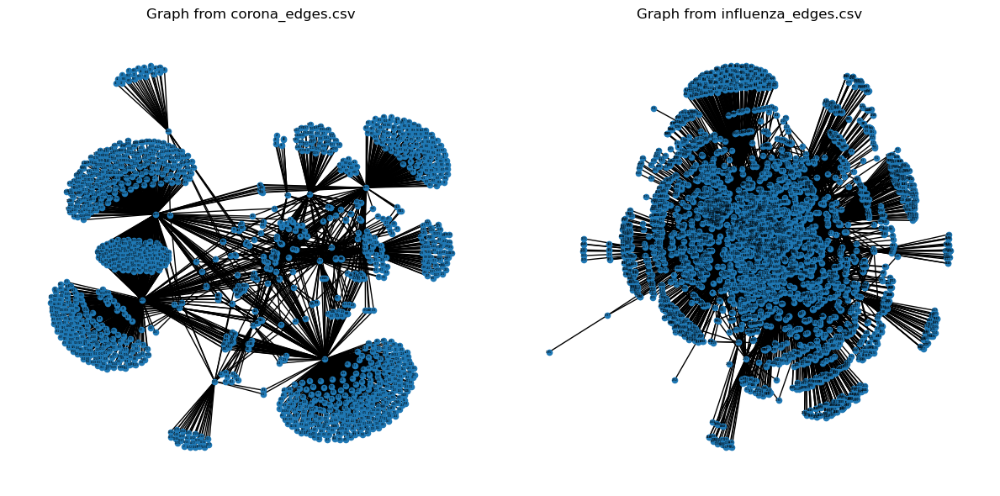

In [2]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

file1_path = "datasets/corona_edges.csv"
file2_path = "datasets/influenza_edges.csv"
data1 = pd.read_csv(file1_path)
data2 = pd.read_csv(file2_path)

G1 = nx.Graph().to_undirected()
G2 = nx.Graph().to_undirected()

for index, row in data1.iterrows():
    node1 = row["V1"]
    node2 = row["V2"]
    G1.add_edge(node1, node2)

for index, row in data2.iterrows():
    node1 = row["V1"]
    node2 = row["V2"]
    G2.add_edge(node1, node2)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))  


pos1 = nx.spring_layout(G1)
pos2 = nx.spring_layout(G2)

nx.draw(G1, pos1, ax=axes[0], with_labels=True, node_size=20, font_size=2)
nx.draw(G2, pos2, ax=axes[1], with_labels=True, node_size=20, font_size=2)


axes[0].set_title('Graph from corona_edges.csv')
axes[1].set_title('Graph from influenza_edges.csv')

combined_filename = "figures/visualisation_corona_influenza_datasets.png"
plt.savefig(combined_filename, dpi=300, bbox_inches='tight')

plt.tight_layout()  
plt.show()

# Corona Centrality Measures

In [2]:
import networkx as nx
import pandas as pd


corona_edge_data = pd.read_csv("datasets/corona_edges.csv"  )

G = nx.Graph().to_undirected()

edges = list(zip(corona_edge_data["V1"], corona_edge_data["V2"]))
G.add_edges_from(edges)


# Calculate centrality measures

closeness_centrality = nx.closeness_centrality(G)
harmonic_centrality = nx.harmonic_centrality(G)
eccentricity = nx.eccentricity(G)
degree_centrality = nx.degree_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
subgraph_centrality = nx.subgraph_centrality(G)
eigenvector_centrality = nx.eigenvector_centrality(G,max_iter=500 )
edge_betweenness_centrality=nx.edge_betweenness_centrality(G)
current_flow_closeness_centrality=nx.current_flow_closeness_centrality(G)
information_centrality=nx.information_centrality(G)
current_flow_betweenness_centrality=nx.current_flow_betweenness_centrality(G)
load_centrality=nx.load_centrality(G)
edge_load_centrality=nx.edge_load_centrality(G)
pagerank=nx.pagerank(G)
second_order_centrality=nx.second_order_centrality(G)
laplacian_centrality=nx.laplacian_centrality(G)
eigenvector_centrality_numpy=nx.eigenvector_centrality_numpy(G)
katz_centrality_numpy=nx.katz_centrality_numpy(G)
subgraph_centrality_exp=nx.subgraph_centrality_exp(G)
approximate_current_flow_betweenness_centrality=nx.approximate_current_flow_betweenness_centrality(G)
edge_current_flow_betweenness_centrality=nx.edge_current_flow_betweenness_centrality(G)
communicability_betweenness_centrality=nx.communicability_betweenness_centrality(G)
estrada_index = nx.estrada_index(G)
voterank=nx.voterank(G)
average_shortest_path_length=nx.average_shortest_path_length(G)
barycenter=nx.barycenter(G)
dispersion=nx.dispersion(G)


# Decay Centrality
delta = 0.5  # You can adjust this parameter as needed
decay_centrality = {}
for node in G.nodes:
    decay_values = [delta ** dist for dist in nx.shortest_path_length(G, source=node).values()]
    decay_centrality[node] = sum(decay_values)


# Radiality centrality
def calculate_radiality_centrality(graph):
    n = len(graph.nodes)
    diam = nx.diameter(graph)
    radiality_centrality = {}
    for u in graph.nodes:
        total_distance = 0
        for w in graph.nodes:
            if u != w:
                total_distance += (diam + 1 - nx.shortest_path_length(graph, source=u, target=w))
        radiality_centrality[u] = total_distance / (n - 1)
    return radiality_centrality

radiality_centrality = calculate_radiality_centrality(G)


# Store each centrality function in separate Excel files, sorted by centrality values

centrality_functions = {

    "closeness_centrality": closeness_centrality,
    "harmonic_centrality": harmonic_centrality,
    "eccentricity": eccentricity,
    "decay_centrality": decay_centrality,
    "subgraph_centrality": subgraph_centrality,
    "eigenvector_centrality": eigenvector_centrality,
    "degree_centrality": degree_centrality,
    "betweenness_centrality": betweenness_centrality,
    "edge_betweenness_centrality": edge_betweenness_centrality,
    "current_flow_closeness_centrality": current_flow_closeness_centrality,
    "information_centrality": information_centrality,
    "current_flow_betweenness_centrality": current_flow_betweenness_centrality,
    "load_centrality": load_centrality,
    "edge_load_centrality": edge_load_centrality,
    "pagerank": pagerank,
    "second_order_centrality": second_order_centrality,
    "laplacian_centrality":laplacian_centrality,
    "eigenvector_centrality_numpy": eigenvector_centrality_numpy,
    "katz_centrality_numpy": katz_centrality_numpy,
    "subgraph_centrality_exp": subgraph_centrality_exp,
    "approximate_current_flow_betweenness_centrality": approximate_current_flow_betweenness_centrality,
    "edge_current_flow_betweenness_centrality": edge_current_flow_betweenness_centrality,
    "communicability_betweenness_centrality": communicability_betweenness_centrality,
    "radiality_centrality":radiality_centrality,
}

for centrality_name, centrality_data in centrality_functions.items():
    sorted_data = sorted(centrality_data.items(), key=lambda x: x[1], reverse=True)
    df = pd.DataFrame(sorted_data, columns=["Node", centrality_name])
    excel_file_name = f"{centrality_name}.xlsx"
    excel_file_path = "outputs/corona_centrality_measures/" + excel_file_name
    df.to_excel(excel_file_path, index=False)
    print(f"{centrality_name} data saved to {excel_file_name}")


# To print centrality measures or save in .txt file

print(estrada_index)
print(voterank)
print(average_shortest_path_length)
print(barycenter)
print(dispersion)

# We generated 3 centrality function from UCINet as follow 
# proximal_betweenness
# katz_centrality
# beta_beach_centrality


closeness_centrality data saved to closeness_centrality.xlsx


# Influenza Centrality Measures

In [3]:
import networkx as nx
import pandas as pd


influenza_edge_data = pd.read_csv("datasets/influenza_edges.csv"  )

G = nx.Graph().to_undirected()

edges = list(zip(influenza_edge_data["V1"], influenza_edge_data["V2"]))
G.add_edges_from(edges)


# Calculate centrality measures

closeness_centrality = nx.closeness_centrality(G)
harmonic_centrality = nx.harmonic_centrality(G)
eccentricity = nx.eccentricity(G)
degree_centrality = nx.degree_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
subgraph_centrality = nx.subgraph_centrality(G)
eigenvector_centrality = nx.eigenvector_centrality(G,max_iter=500 )
edge_betweenness_centrality=nx.edge_betweenness_centrality(G)
current_flow_closeness_centrality=nx.current_flow_closeness_centrality(G)
information_centrality=nx.information_centrality(G)
current_flow_betweenness_centrality=nx.current_flow_betweenness_centrality(G)
load_centrality=nx.load_centrality(G)
edge_load_centrality=nx.edge_load_centrality(G)
pagerank=nx.pagerank(G)
second_order_centrality=nx.second_order_centrality(G)
laplacian_centrality=nx.laplacian_centrality(G)
eigenvector_centrality_numpy=nx.eigenvector_centrality_numpy(G)
katz_centrality_numpy=nx.katz_centrality_numpy(G)
subgraph_centrality_exp=nx.subgraph_centrality_exp(G)
approximate_current_flow_betweenness_centrality=nx.approximate_current_flow_betweenness_centrality(G)
edge_current_flow_betweenness_centrality=nx.edge_current_flow_betweenness_centrality(G)
communicability_betweenness_centrality=nx.communicability_betweenness_centrality(G)
estrada_index = nx.estrada_index(G)
voterank=nx.voterank(G)
average_shortest_path_length=nx.average_shortest_path_length(G)
barycenter=nx.barycenter(G)
dispersion=nx.dispersion(G)


# Decay Centrality
delta = 0.5  # You can adjust this parameter as needed
decay_centrality = {}
for node in G.nodes:
    decay_values = [delta ** dist for dist in nx.shortest_path_length(G, source=node).values()]
    decay_centrality[node] = sum(decay_values)


# Radiality centrality
def calculate_radiality_centrality(graph):
    n = len(graph.nodes)
    diam = nx.diameter(graph)
    radiality_centrality = {}
    for u in graph.nodes:
        total_distance = 0
        for w in graph.nodes:
            if u != w:
                total_distance += (diam + 1 - nx.shortest_path_length(graph, source=u, target=w))
        radiality_centrality[u] = total_distance / (n - 1)
    return radiality_centrality

radiality_centrality = calculate_radiality_centrality(G)


# Store each centrality function in separate Excel files, sorted by centrality values

centrality_functions = {

    "closeness_centrality": closeness_centrality,
    "harmonic_centrality": harmonic_centrality,
    "eccentricity": eccentricity,
    "decay_centrality": decay_centrality,
    "subgraph_centrality": subgraph_centrality,
    "eigenvector_centrality": eigenvector_centrality,
    "degree_centrality": degree_centrality,
    "betweenness_centrality": betweenness_centrality,
    "edge_betweenness_centrality": edge_betweenness_centrality,
    "current_flow_closeness_centrality": current_flow_closeness_centrality,
    "information_centrality": information_centrality,
    "current_flow_betweenness_centrality": current_flow_betweenness_centrality,
    "load_centrality": load_centrality,
    "edge_load_centrality": edge_load_centrality,
    "pagerank": pagerank,
    "second_order_centrality": second_order_centrality,
    "laplacian_centrality":laplacian_centrality,
    "eigenvector_centrality_numpy": eigenvector_centrality_numpy,
    "katz_centrality_numpy": katz_centrality_numpy,
    "subgraph_centrality_exp": subgraph_centrality_exp,
    "approximate_current_flow_betweenness_centrality": approximate_current_flow_betweenness_centrality,
    "edge_current_flow_betweenness_centrality": edge_current_flow_betweenness_centrality,
    "communicability_betweenness_centrality": communicability_betweenness_centrality,
    "radiality_centrality":radiality_centrality,
}

for centrality_name, centrality_data in centrality_functions.items():
    sorted_data = sorted(centrality_data.items(), key=lambda x: x[1], reverse=True)
    df = pd.DataFrame(sorted_data, columns=["Node", centrality_name])
    excel_file_name = f"{centrality_name}.xlsx"
    excel_file_path = "outputs/influenza_centrality_measures/" + excel_file_name
    df.to_excel(excel_file_path, index=False)
    print(f"{centrality_name} data saved to {excel_file_name}")


# To print centrality measures or save in .txt file

print(estrada_index)
print(voterank)
print(average_shortest_path_length)
print(barycenter)
print(dispersion)

# We generated 3 centrality function from UCINet as follow 
# proximal_betweenness
# katz_centrality
# beta_beach_centrality

closeness_centrality data saved to closeness_centrality.xlsx


# Visualising Centrality Measures

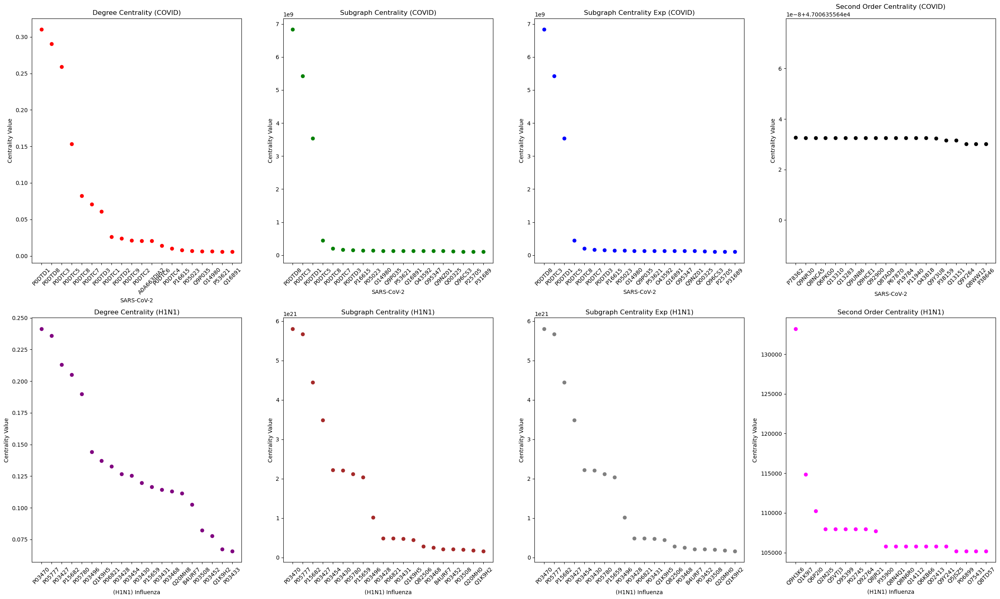

In [4]:
import pandas as pd
import matplotlib.pyplot as plt

# Load node labels for COVID and H1N1
covid_node_labels = pd.read_excel("datasets/corona_nodes.xlsx")
h1n1_node_labels = pd.read_excel("datasets/influenza_nodes.xlsx")

# Load centrality data for the two graphs and centrality measures
covid_degree_data = pd.read_excel("outputs/corona_centrality_measures/degree_centrality.xlsx")
h1n1_degree_data = pd.read_excel("outputs/influenza_centrality_measures/degree_centrality.xlsx")

covid_subgraph_data = pd.read_excel("outputs/corona_centrality_measures/subgraph_centrality.xlsx")
h1n1_subgraph_data = pd.read_excel("outputs/influenza_centrality_measures/subgraph_centrality.xlsx")

covid_subgraph_exp_data = pd.read_excel("outputs/corona_centrality_measures/subgraph_centrality_exp.xlsx")
h1n1_subgraph_exp_data = pd.read_excel("outputs/influenza_centrality_measures/subgraph_centrality_exp.xlsx")

covid_second_order_data = pd.read_excel("outputs/corona_centrality_measures/second_order_centrality.xlsx")
h1n1_second_order_data = pd.read_excel("outputs/influenza_centrality_measures/second_order_centrality.xlsx")

# Merge node labels with centrality data
covid_degree_data = covid_degree_data.merge(covid_node_labels, on='Node')
h1n1_degree_data = h1n1_degree_data.merge(h1n1_node_labels, on='Node')
covid_subgraph_data = covid_subgraph_data.merge(covid_node_labels, on='Node')
h1n1_subgraph_data = h1n1_subgraph_data.merge(h1n1_node_labels, on='Node')
covid_subgraph_exp_data = covid_subgraph_exp_data.merge(covid_node_labels, on='Node')
h1n1_subgraph_exp_data = h1n1_subgraph_exp_data.merge(h1n1_node_labels, on='Node')
covid_second_order_data = covid_second_order_data.merge(covid_node_labels, on='Node')
h1n1_second_order_data = h1n1_second_order_data.merge(h1n1_node_labels, on='Node')

# Choose the top number of nodes to visualize
num_top_nodes = 20

# Create subplots for each centrality measure
plt.figure(figsize=(25, 15))

# COVID Degree Centrality
plt.subplot(2, 4, 1)
top_nodes_covid_degree = covid_degree_data.nlargest(num_top_nodes, 'degree_centrality')
plt.scatter(top_nodes_covid_degree['corona_nodes'], top_nodes_covid_degree['degree_centrality'], color='red')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title('Degree Centrality (COVID)')
plt.xticks(rotation=45)

# COVID Subgraph Centrality
plt.subplot(2, 4, 2)
top_nodes_covid_subgraph = covid_subgraph_data.nlargest(num_top_nodes, 'subgraph_centrality')
plt.scatter(top_nodes_covid_subgraph['corona_nodes'], top_nodes_covid_subgraph['subgraph_centrality'], color='green')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title('Subgraph Centrality (COVID)')
plt.xticks(rotation=45)

# COVID Subgraph Centrality Exp
plt.subplot(2, 4, 3)
top_nodes_covid_subgraph_exp = covid_subgraph_exp_data.nlargest(num_top_nodes, 'subgraph_centrality_exp')
plt.scatter(top_nodes_covid_subgraph_exp['corona_nodes'], top_nodes_covid_subgraph_exp['subgraph_centrality_exp'], color='blue')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title('Subgraph Centrality Exp (COVID)')
plt.xticks(rotation=45)

# COVID Second Order Centrality
plt.subplot(2, 4, 4)
top_nodes_covid_second_order = covid_second_order_data.nlargest(num_top_nodes, 'second_order_centrality')
plt.scatter(top_nodes_covid_second_order['corona_nodes'], top_nodes_covid_second_order['second_order_centrality'], color='black')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title('Second Order Centrality (COVID)')
plt.xticks(rotation=45)

# H1N1 Degree Centrality
plt.subplot(2, 4, 5)
top_nodes_h1n1_degree = h1n1_degree_data.nlargest(num_top_nodes, 'degree_centrality')
plt.scatter(top_nodes_h1n1_degree['influenza_nodes'], top_nodes_h1n1_degree['degree_centrality'], color='purple')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title('Degree Centrality (H1N1)')
plt.xticks(rotation=45)

# H1N1 Subgraph Centrality
plt.subplot(2, 4, 6)
top_nodes_h1n1_subgraph = h1n1_subgraph_data.nlargest(num_top_nodes, 'subgraph_centrality')
plt.scatter(top_nodes_h1n1_subgraph['influenza_nodes'], top_nodes_h1n1_subgraph['subgraph_centrality'], color='brown')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title('Subgraph Centrality (H1N1)')
plt.xticks(rotation=45)

# H1N1 Subgraph Centrality Exp
plt.subplot(2, 4, 7)
top_nodes_h1n1_subgraph_exp = h1n1_subgraph_exp_data.nlargest(num_top_nodes, 'subgraph_centrality_exp')
plt.scatter(top_nodes_h1n1_subgraph_exp['influenza_nodes'], top_nodes_h1n1_subgraph_exp['subgraph_centrality_exp'], color='gray')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title('Subgraph Centrality Exp (H1N1)')
plt.xticks(rotation=45)

# H1N1 Second Order Centrality
plt.subplot(2, 4, 8)
top_nodes_h1n1_second_order = h1n1_second_order_data.nlargest(num_top_nodes, 'second_order_centrality')
plt.scatter(top_nodes_h1n1_second_order['influenza_nodes'], top_nodes_h1n1_second_order['second_order_centrality'], color='magenta')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title('Second Order Centrality (H1N1)')
plt.xticks(rotation=45)

plt.tight_layout()

# Save the combined image
combined_filename = "figures/centrality_measures/1.png"
plt.savefig(combined_filename, dpi=300, bbox_inches='tight')
plt.show()

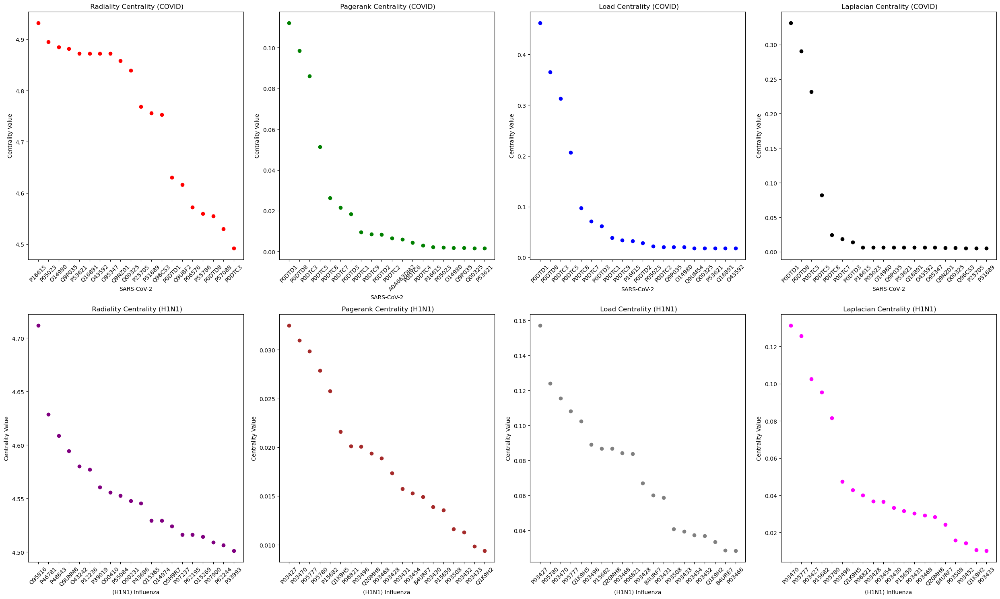

In [5]:
import pandas as pd
import matplotlib.pyplot as plt

# Load node labels for COVID and H1N1
covid_node_labels = pd.read_excel("datasets/corona_nodes.xlsx")
h1n1_node_labels = pd.read_excel("datasets/influenza_nodes.xlsx")

# Load centrality data for the two graphs and centrality measures
covid_radiality_data = pd.read_excel("outputs/corona_centrality_measures/radiality_centrality.xlsx")
h1n1_radiality_data = pd.read_excel("outputs/influenza_centrality_measures/radiality_centrality.xlsx")

covid_pagerank_data = pd.read_excel("outputs/corona_centrality_measures/pagerank.xlsx")
h1n1_pagerank_data = pd.read_excel("outputs/influenza_centrality_measures/pagerank.xlsx")

covid_load_centrality_data = pd.read_excel("outputs/corona_centrality_measures/load_centrality.xlsx")
h1n1_load_centrality_data = pd.read_excel("outputs/influenza_centrality_measures/load_centrality.xlsx")

covid_laplacian_centrality_data = pd.read_excel("outputs/corona_centrality_measures/laplacian_centrality.xlsx")
h1n1_laplacian_centrality_data = pd.read_excel("outputs/influenza_centrality_measures/laplacian_centrality.xlsx")

# Merge node labels with centrality data
covid_radiality_data = covid_radiality_data.merge(covid_node_labels, on='Node')
h1n1_radiality_data = h1n1_radiality_data.merge(h1n1_node_labels, on='Node')
covid_pagerank_data = covid_pagerank_data.merge(covid_node_labels, on='Node')
h1n1_pagerank_data = h1n1_pagerank_data.merge(h1n1_node_labels, on='Node')
covid_load_centrality_data = covid_load_centrality_data.merge(covid_node_labels, on='Node')
h1n1_load_centrality_data = h1n1_load_centrality_data.merge(h1n1_node_labels, on='Node')
covid_laplacian_centrality_data = covid_laplacian_centrality_data.merge(covid_node_labels, on='Node')
h1n1_laplacian_centrality_data = h1n1_laplacian_centrality_data.merge(h1n1_node_labels, on='Node')

# Choose the top number of nodes to visualize
num_top_nodes = 20

# Create subplots for each centrality measure
plt.figure(figsize=(25, 15))

# COVID Radiality Centrality
plt.subplot(2, 4, 1)
top_nodes_covid_radiality = covid_radiality_data.nlargest(num_top_nodes, 'radiality_centrality')
plt.scatter(top_nodes_covid_radiality['corona_nodes'], top_nodes_covid_radiality['radiality_centrality'], color='red')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title(' Radiality Centrality (COVID)')
plt.xticks(rotation=45)

# COVID Pagerank Centrality
plt.subplot(2, 4, 2)
top_nodes_covid_pagerank = covid_pagerank_data.nlargest(num_top_nodes, 'pagerank')
plt.scatter(top_nodes_covid_pagerank['corona_nodes'], top_nodes_covid_pagerank['pagerank'], color='green')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title(' Pagerank Centrality (COVID)')
plt.xticks(rotation=45)

# COVID Load Centrality
plt.subplot(2, 4, 3)
top_nodes_covid_load_centrality = covid_load_centrality_data.nlargest(num_top_nodes, 'load_centrality')
plt.scatter(top_nodes_covid_load_centrality['corona_nodes'], top_nodes_covid_load_centrality['load_centrality'], color='blue')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title(' Load Centrality (COVID)')
plt.xticks(rotation=45)

# COVID Laplacian Centrality
plt.subplot(2, 4, 4)
top_nodes_covid_laplacian_centrality = covid_laplacian_centrality_data.nlargest(num_top_nodes, 'laplacian_centrality')
plt.scatter(top_nodes_covid_laplacian_centrality['corona_nodes'], top_nodes_covid_laplacian_centrality['laplacian_centrality'], color='black')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title(' Laplacian Centrality (COVID)')
plt.xticks(rotation=45)

# H1N1 Radiality Centrality
plt.subplot(2, 4, 5)
top_nodes_h1n1_radiality = h1n1_radiality_data.nlargest(num_top_nodes, 'radiality_centrality')
plt.scatter(top_nodes_h1n1_radiality['influenza_nodes'], top_nodes_h1n1_radiality['radiality_centrality'], color='purple')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Radiality Centrality (H1N1)')
plt.xticks(rotation=45)

# H1N1 Pagerank Centrality
plt.subplot(2, 4, 6)
top_nodes_h1n1_pagerank = h1n1_pagerank_data.nlargest(num_top_nodes, 'pagerank')
plt.scatter(top_nodes_h1n1_pagerank['influenza_nodes'], top_nodes_h1n1_pagerank['pagerank'], color='brown')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Pagerank Centrality (H1N1)')
plt.xticks(rotation=45)

# H1N1 Load Centrality
plt.subplot(2, 4, 7)
top_nodes_h1n1_load_centrality = h1n1_load_centrality_data.nlargest(num_top_nodes, 'load_centrality')
plt.scatter(top_nodes_h1n1_load_centrality['influenza_nodes'], top_nodes_h1n1_load_centrality['load_centrality'], color='gray')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Load Centrality (H1N1)')
plt.xticks(rotation=45)

# H1N1 Laplacian Centrality
plt.subplot(2, 4, 8)
top_nodes_h1n1_laplacian_centrality = h1n1_laplacian_centrality_data.nlargest(num_top_nodes, 'laplacian_centrality')
plt.scatter(top_nodes_h1n1_laplacian_centrality['influenza_nodes'], top_nodes_h1n1_laplacian_centrality['laplacian_centrality'], color='magenta')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Laplacian Centrality (H1N1)')
plt.xticks(rotation=45)

plt.tight_layout()


# Save the combined image
combined_filename = "figures/centrality_measures/2.png"
plt.savefig(combined_filename, dpi=300, bbox_inches='tight')
plt.show()

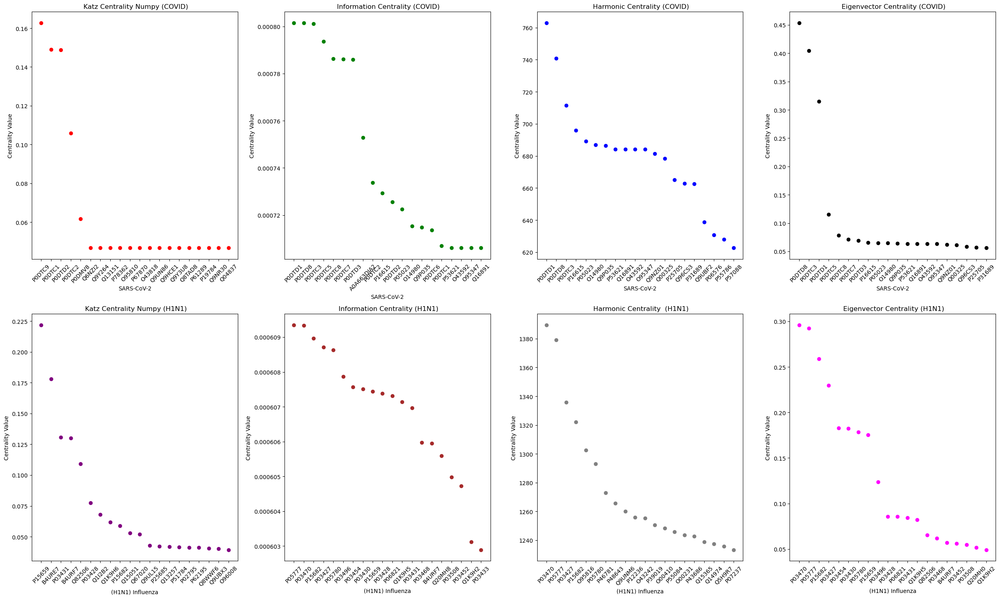

In [6]:
import pandas as pd
import matplotlib.pyplot as plt

# Load node labels for COVID and H1N1
covid_node_labels = pd.read_excel("datasets/corona_nodes.xlsx")
h1n1_node_labels = pd.read_excel("datasets/influenza_nodes.xlsx")

# Load centrality data for the two graphs and centrality measures
covid_katz_centrality_data = pd.read_excel("outputs/corona_centrality_measures/katz_centrality_numpy.xlsx")
h1n1_katz_centrality_data = pd.read_excel("outputs/influenza_centrality_measures/katz_centrality_numpy.xlsx")

covid_information_centrality_data = pd.read_excel("outputs/corona_centrality_measures/information_centrality.xlsx")
h1n1_information_centrality_data = pd.read_excel("outputs/influenza_centrality_measures/information_centrality.xlsx")

covid_harmonic_centrality_data = pd.read_excel("outputs/corona_centrality_measures/harmonic_centrality.xlsx")
h1n1_harmonic_centrality_data = pd.read_excel("outputs/influenza_centrality_measures/harmonic_centrality.xlsx")

covid_eigenvector_centrality_data = pd.read_excel("outputs/corona_centrality_measures/eigenvector_centrality.xlsx")
h1n1_eigenvector_centrality_data = pd.read_excel("outputs/influenza_centrality_measures/eigenvector_centrality.xlsx")

# Merge node labels with centrality data
covid_katz_centrality_data = covid_katz_centrality_data.merge(covid_node_labels, on='Node')
h1n1_katz_centrality_data = h1n1_katz_centrality_data.merge(h1n1_node_labels, on='Node')
covid_information_centrality_data = covid_information_centrality_data.merge(covid_node_labels, on='Node')
h1n1_information_centrality_data = h1n1_information_centrality_data.merge(h1n1_node_labels, on='Node')
covid_harmonic_centrality_data = covid_harmonic_centrality_data.merge(covid_node_labels, on='Node')
h1n1_harmonic_centrality_data = h1n1_harmonic_centrality_data.merge(h1n1_node_labels, on='Node')
covid_eigenvector_centrality_data = covid_eigenvector_centrality_data.merge(covid_node_labels, on='Node')
h1n1_eigenvector_centrality_data = h1n1_eigenvector_centrality_data.merge(h1n1_node_labels, on='Node')

# Choose the top number of nodes to visualize
num_top_nodes = 20

# Create subplots for each centrality measure
plt.figure(figsize=(25, 15))

# COVID Katz Centrality Numpy
plt.subplot(2, 4, 1)
top_nodes_covid_katz_centrality = covid_katz_centrality_data.nlargest(num_top_nodes, 'katz_centrality_numpy')
plt.scatter(top_nodes_covid_katz_centrality['corona_nodes'], top_nodes_covid_katz_centrality['katz_centrality_numpy'], color='red')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title(' Katz Centrality Numpy (COVID)')
plt.xticks(rotation=45)

# COVID Information Centrality
plt.subplot(2, 4, 2)
top_nodes_covid_information_centrality = covid_information_centrality_data.nlargest(num_top_nodes, 'information_centrality')
plt.scatter(top_nodes_covid_information_centrality['corona_nodes'], top_nodes_covid_information_centrality['information_centrality'], color='green')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title(' Information Centrality (COVID)')
plt.xticks(rotation=45)

# COVID Harmonic Centrality
plt.subplot(2, 4, 3)
top_nodes_covid_harmonic_centrality = covid_harmonic_centrality_data.nlargest(num_top_nodes, 'harmonic_centrality')
plt.scatter(top_nodes_covid_harmonic_centrality['corona_nodes'], top_nodes_covid_harmonic_centrality['harmonic_centrality'], color='blue')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title(' Harmonic Centrality (COVID)')
plt.xticks(rotation=45)

# COVID Eigenvector Centrality
plt.subplot(2, 4, 4)
top_nodes_covid_eigenvector_centrality = covid_eigenvector_centrality_data.nlargest(num_top_nodes, 'eigenvector_centrality')
plt.scatter(top_nodes_covid_eigenvector_centrality['corona_nodes'], top_nodes_covid_eigenvector_centrality['eigenvector_centrality'], color='black')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title(' Eigenvector Centrality (COVID)')
plt.xticks(rotation=45)

# H1N1 Katz Centrality Numpy
plt.subplot(2, 4, 5)
top_nodes_h1n1_katz_centrality = h1n1_katz_centrality_data.nlargest(num_top_nodes, 'katz_centrality_numpy')
plt.scatter(top_nodes_h1n1_katz_centrality['influenza_nodes'], top_nodes_h1n1_katz_centrality['katz_centrality_numpy'], color='purple')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Katz Centrality Numpy (H1N1)')
plt.xticks(rotation=45)

# H1N1 Information Centrality
plt.subplot(2, 4, 6)
top_nodes_h1n1_information_centrality = h1n1_information_centrality_data.nlargest(num_top_nodes, 'information_centrality')
plt.scatter(top_nodes_h1n1_information_centrality['influenza_nodes'], top_nodes_h1n1_information_centrality['information_centrality'], color='brown')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Information Centrality (H1N1)')
plt.xticks(rotation=45)

# H1N1 Harmonic Centrality
plt.subplot(2, 4, 7)
top_nodes_h1n1_harmonic_centrality = h1n1_harmonic_centrality_data.nlargest(num_top_nodes, 'harmonic_centrality')
plt.scatter(top_nodes_h1n1_harmonic_centrality['influenza_nodes'], top_nodes_h1n1_harmonic_centrality['harmonic_centrality'], color='gray')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Harmonic Centrality  (H1N1)')
plt.xticks(rotation=45)

# H1N1 Eigenvector Centrality
plt.subplot(2, 4, 8)
top_nodes_h1n1_eigenvector_centrality = h1n1_eigenvector_centrality_data.nlargest(num_top_nodes, 'eigenvector_centrality')
plt.scatter(top_nodes_h1n1_eigenvector_centrality['influenza_nodes'], top_nodes_h1n1_eigenvector_centrality['eigenvector_centrality'], color='magenta')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Eigenvector Centrality (H1N1)')
plt.xticks(rotation=45)

plt.tight_layout()


# Save the combined image
combined_filename = "figures/centrality_measures/3.png"
plt.savefig(combined_filename, dpi=300, bbox_inches='tight')
plt.show()

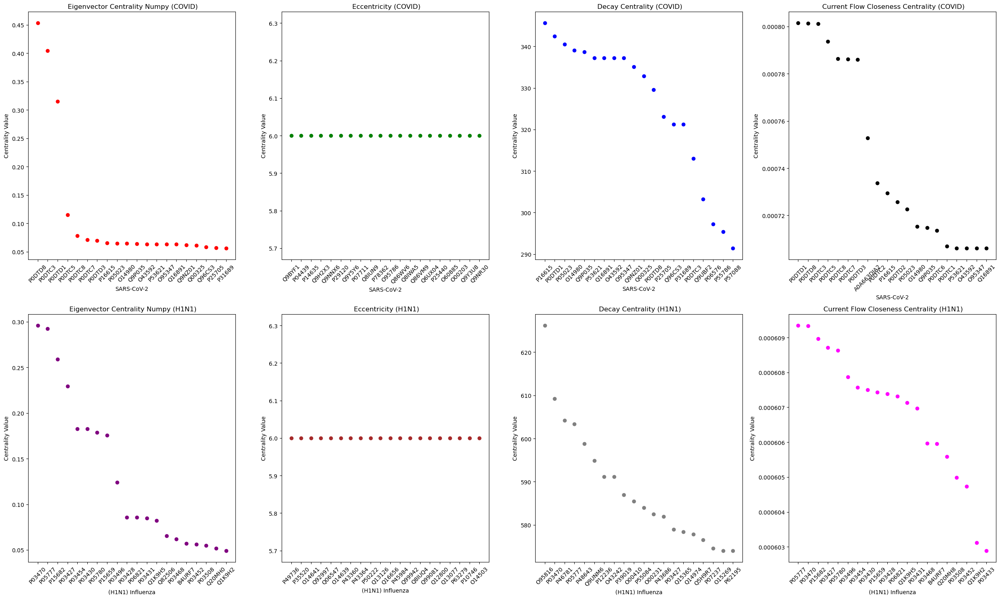

In [7]:
import pandas as pd
import matplotlib.pyplot as plt

# Load node labels for COVID and H1N1
covid_node_labels = pd.read_excel("datasets/corona_nodes.xlsx")
h1n1_node_labels = pd.read_excel("datasets/influenza_nodes.xlsx")

# Load centrality data for the two graphs and centrality measures
covid_eigenvector_centrality_numpy_data = pd.read_excel("outputs/corona_centrality_measures/eigenvector_centrality_numpy.xlsx")
h1n1_eigenvector_centrality_numpy_data = pd.read_excel("outputs/influenza_centrality_measures/eigenvector_centrality_numpy.xlsx")

covid_eccentricity_data = pd.read_excel("outputs/corona_centrality_measures/eccentricity.xlsx")
h1n1_eccentricity_data = pd.read_excel("outputs/influenza_centrality_measures/eccentricity.xlsx")

covid_decay_centrality_data = pd.read_excel("outputs/corona_centrality_measures/decay_centrality.xlsx")
h1n1_decay_centrality_data = pd.read_excel("outputs/influenza_centrality_measures/decay_centrality.xlsx")

covid_current_flow_closeness_centrality_data = pd.read_excel("outputs/corona_centrality_measures/current_flow_closeness_centrality.xlsx")
h1n1_current_flow_closeness_centrality_data = pd.read_excel("outputs/influenza_centrality_measures/current_flow_closeness_centrality.xlsx")

# Merge node labels with centrality data
covid_eigenvector_centrality_numpy_data = covid_eigenvector_centrality_numpy_data.merge(covid_node_labels, on='Node')
h1n1_eigenvector_centrality_numpy_data = h1n1_eigenvector_centrality_numpy_data.merge(h1n1_node_labels, on='Node')
covid_eccentricity_data = covid_eccentricity_data.merge(covid_node_labels, on='Node')
h1n1_eccentricity_data = h1n1_eccentricity_data.merge(h1n1_node_labels, on='Node')
covid_decay_centrality_data = covid_decay_centrality_data.merge(covid_node_labels, on='Node')
h1n1_decay_centrality_data = h1n1_decay_centrality_data.merge(h1n1_node_labels, on='Node')
covid_current_flow_closeness_centrality_data = covid_current_flow_closeness_centrality_data.merge(covid_node_labels, on='Node')
h1n1_current_flow_closeness_centrality_data = h1n1_current_flow_closeness_centrality_data.merge(h1n1_node_labels, on='Node')

# Choose the top number of nodes to visualize
num_top_nodes = 20

# Create subplots for each centrality measure
plt.figure(figsize=(25, 15))

# COVID Eigenvector Centrality Numpy
plt.subplot(2, 4, 1)
top_nodes_covid_eigenvector_centrality_numpy = covid_eigenvector_centrality_numpy_data.nlargest(num_top_nodes, 'eigenvector_centrality_numpy')
plt.scatter(top_nodes_covid_eigenvector_centrality_numpy['corona_nodes'], top_nodes_covid_eigenvector_centrality_numpy['eigenvector_centrality_numpy'], color='red')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title(' Eigenvector Centrality Numpy (COVID)')
plt.xticks(rotation=45)

# COVID Eccentricity
plt.subplot(2, 4, 2)
top_nodes_covid_eccentricity = covid_eccentricity_data.nlargest(num_top_nodes, 'eccentricity')
plt.scatter(top_nodes_covid_eccentricity['corona_nodes'], top_nodes_covid_eccentricity['eccentricity'], color='green')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title(' Eccentricity (COVID)')
plt.xticks(rotation=45)

# COVID Decay Centrality
plt.subplot(2, 4, 3)
top_nodes_covid_decay_centrality = covid_decay_centrality_data.nlargest(num_top_nodes, 'decay_centrality')
plt.scatter(top_nodes_covid_decay_centrality['corona_nodes'], top_nodes_covid_decay_centrality['decay_centrality'], color='blue')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title(' Decay Centrality (COVID)')
plt.xticks(rotation=45)

# COVID Current Flow Closeness Centrality
plt.subplot(2, 4, 4)
top_nodes_covid_current_flow_closeness_centrality = covid_current_flow_closeness_centrality_data.nlargest(num_top_nodes, 'current_flow_closeness_centrality')
plt.scatter(top_nodes_covid_current_flow_closeness_centrality['corona_nodes'], top_nodes_covid_current_flow_closeness_centrality['current_flow_closeness_centrality'], color='black')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title(' Current Flow Closeness Centrality (COVID)')
plt.xticks(rotation=45)

# H1N1 Eigenvector Centrality Numpy
plt.subplot(2, 4, 5)
top_nodes_h1n1_eigenvector_centrality_numpy = h1n1_eigenvector_centrality_numpy_data.nlargest(num_top_nodes, 'eigenvector_centrality_numpy')
plt.scatter(top_nodes_h1n1_eigenvector_centrality_numpy['influenza_nodes'], top_nodes_h1n1_eigenvector_centrality_numpy['eigenvector_centrality_numpy'], color='purple')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Eigenvector Centrality Numpy (H1N1)')
plt.xticks(rotation=45)

# H1N1 Eccentricity
plt.subplot(2, 4, 6)
top_nodes_h1n1_eccentricity = h1n1_eccentricity_data.nlargest(num_top_nodes, 'eccentricity')
plt.scatter(top_nodes_h1n1_eccentricity['influenza_nodes'], top_nodes_h1n1_eccentricity['eccentricity'], color='brown')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Eccentricity (H1N1)')
plt.xticks(rotation=45)

# H1N1 Decay Centrality
plt.subplot(2, 4, 7)
top_nodes_h1n1_decay_centrality = h1n1_decay_centrality_data.nlargest(num_top_nodes, 'decay_centrality')
plt.scatter(top_nodes_h1n1_decay_centrality['influenza_nodes'], top_nodes_h1n1_decay_centrality['decay_centrality'], color='gray')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Decay Centrality (H1N1)')
plt.xticks(rotation=45)

# H1N1 Current Flow Closeness Centrality
plt.subplot(2, 4, 8)
top_nodes_h1n1_current_flow_closeness_centrality = h1n1_current_flow_closeness_centrality_data.nlargest(num_top_nodes, 'current_flow_closeness_centrality')
plt.scatter(top_nodes_h1n1_current_flow_closeness_centrality['influenza_nodes'], top_nodes_h1n1_current_flow_closeness_centrality['current_flow_closeness_centrality'], color='magenta')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Current Flow Closeness Centrality (H1N1)')
plt.xticks(rotation=45)

plt.tight_layout()

# Save the combined image
combined_filename = "figures/centrality_measures/4.png"
plt.savefig(combined_filename, dpi=300, bbox_inches='tight')
plt.show()

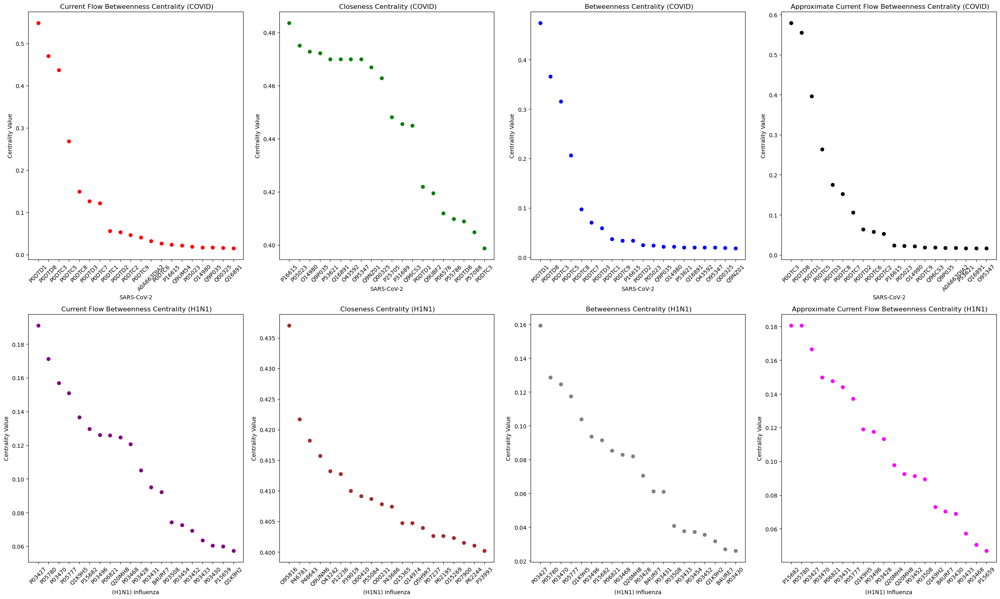

In [8]:
import pandas as pd
import matplotlib.pyplot as plt

# Load node labels for COVID and H1N1
covid_node_labels = pd.read_excel("datasets/corona_nodes.xlsx")
h1n1_node_labels = pd.read_excel("datasets/influenza_nodes.xlsx")

# Load centrality data for the two graphs and centrality measures
covid_current_flow_betweenness_data = pd.read_excel("outputs/corona_centrality_measures/current_flow_betweenness_centrality.xlsx")
h1n1_current_flow_betweenness_data = pd.read_excel("outputs/influenza_centrality_measures/current_flow_betweenness_centrality.xlsx")

covid_closeness_centrality_data = pd.read_excel("outputs/corona_centrality_measures/closeness_centrality.xlsx")
h1n1_closeness_centrality_data = pd.read_excel("outputs/influenza_centrality_measures/closeness_centrality.xlsx")

covid_betweenness_centrality_data = pd.read_excel("outputs/corona_centrality_measures/betweenness_centrality.xlsx")
h1n1_betweenness_centrality_data = pd.read_excel("outputs/influenza_centrality_measures/betweenness_centrality.xlsx")

covid_approximate_current_flow_betweenness_data = pd.read_excel("outputs/corona_centrality_measures/approximate_current_flow_betweenness_centrality.xlsx")
h1n1_approximate_current_flow_betweenness_data = pd.read_excel("outputs/influenza_centrality_measures/approximate_current_flow_betweenness_centrality.xlsx")

# Merge node labels with centrality data
covid_current_flow_betweenness_data = covid_current_flow_betweenness_data.merge(covid_node_labels, on='Node')
h1n1_current_flow_betweenness_data = h1n1_current_flow_betweenness_data.merge(h1n1_node_labels, on='Node')
covid_closeness_centrality_data = covid_closeness_centrality_data.merge(covid_node_labels, on='Node')
h1n1_closeness_centrality_data = h1n1_closeness_centrality_data.merge(h1n1_node_labels, on='Node')
covid_betweenness_centrality_data = covid_betweenness_centrality_data.merge(covid_node_labels, on='Node')
h1n1_betweenness_centrality_data = h1n1_betweenness_centrality_data.merge(h1n1_node_labels, on='Node')
covid_approximate_current_flow_betweenness_data = covid_approximate_current_flow_betweenness_data.merge(covid_node_labels, on='Node')
h1n1_approximate_current_flow_betweenness_data = h1n1_approximate_current_flow_betweenness_data.merge(h1n1_node_labels, on='Node')

# Choose the top number of nodes to visualize
num_top_nodes = 20

# Create subplots for each centrality measure
plt.figure(figsize=(25, 15))

# COVID Current Flow Betweenness Centrality
plt.subplot(2, 4, 1)
top_nodes_covid_current_flow_betweenness = covid_current_flow_betweenness_data.nlargest(num_top_nodes, 'current_flow_betweenness_centrality')
plt.scatter(top_nodes_covid_current_flow_betweenness['corona_nodes'], top_nodes_covid_current_flow_betweenness['current_flow_betweenness_centrality'], color='red')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title(' Current Flow Betweenness Centrality (COVID)')
plt.xticks(rotation=45)

# COVID Closeness Centrality
plt.subplot(2, 4, 2)
top_nodes_covid_closeness_centrality = covid_closeness_centrality_data.nlargest(num_top_nodes, 'closeness_centrality')
plt.scatter(top_nodes_covid_closeness_centrality['corona_nodes'], top_nodes_covid_closeness_centrality['closeness_centrality'], color='green')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title(' Closeness Centrality (COVID)')
plt.xticks(rotation=45)

# COVID Betweenness Centrality
plt.subplot(2, 4, 3)
top_nodes_covid_betweenness_centrality = covid_betweenness_centrality_data.nlargest(num_top_nodes, 'betweenness_centrality')
plt.scatter(top_nodes_covid_betweenness_centrality['corona_nodes'], top_nodes_covid_betweenness_centrality['betweenness_centrality'], color='blue')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title(' Betweenness Centrality (COVID)')
plt.xticks(rotation=45)

# COVID Approximate Current Flow Betweenness Centrality
plt.subplot(2, 4, 4)
top_nodes_covid_approximate_current_flow_betweenness = covid_approximate_current_flow_betweenness_data.nlargest(num_top_nodes, 'approximate_current_flow_betweenness_centrality')
plt.scatter(top_nodes_covid_approximate_current_flow_betweenness['corona_nodes'], top_nodes_covid_approximate_current_flow_betweenness['approximate_current_flow_betweenness_centrality'], color='black')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title(' Approximate Current Flow Betweenness Centrality (COVID)')
plt.xticks(rotation=45)

# H1N1 Current Flow Betweenness Centrality
plt.subplot(2, 4, 5)
top_nodes_h1n1_current_flow_betweenness = h1n1_current_flow_betweenness_data.nlargest(num_top_nodes, 'current_flow_betweenness_centrality')
plt.scatter(top_nodes_h1n1_current_flow_betweenness['influenza_nodes'], top_nodes_h1n1_current_flow_betweenness['current_flow_betweenness_centrality'], color='purple')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Current Flow Betweenness Centrality (H1N1)')
plt.xticks(rotation=45)

# H1N1 Closeness Centrality
plt.subplot(2, 4, 6)
top_nodes_h1n1_closeness_centrality = h1n1_closeness_centrality_data.nlargest(num_top_nodes, 'closeness_centrality')
plt.scatter(top_nodes_h1n1_closeness_centrality['influenza_nodes'], top_nodes_h1n1_closeness_centrality['closeness_centrality'], color='brown')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Closeness Centrality (H1N1)')
plt.xticks(rotation=45)

# H1N1 Betweenness Centrality
plt.subplot(2, 4, 7)
top_nodes_h1n1_betweenness_centrality = h1n1_betweenness_centrality_data.nlargest(num_top_nodes, 'betweenness_centrality')
plt.scatter(top_nodes_h1n1_betweenness_centrality['influenza_nodes'], top_nodes_h1n1_betweenness_centrality['betweenness_centrality'], color='gray')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Betweenness Centrality (H1N1)')
plt.xticks(rotation=45)

# H1N1 Approximate Current Flow Betweenness Centrality
plt.subplot(2, 4, 8)
top_nodes_h1n1_approximate_current_flow_betweenness = h1n1_approximate_current_flow_betweenness_data.nlargest(num_top_nodes, 'approximate_current_flow_betweenness_centrality')
plt.scatter(top_nodes_h1n1_approximate_current_flow_betweenness['influenza_nodes'], top_nodes_h1n1_approximate_current_flow_betweenness['approximate_current_flow_betweenness_centrality'], color='magenta')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Approximate Current Flow Betweenness Centrality (H1N1)')
plt.xticks(rotation=45)

plt.tight_layout()

# Save the combined image
combined_filename = "figures/centrality_measures/5.png"
plt.savefig(combined_filename, dpi=300, bbox_inches='tight')
plt.show()

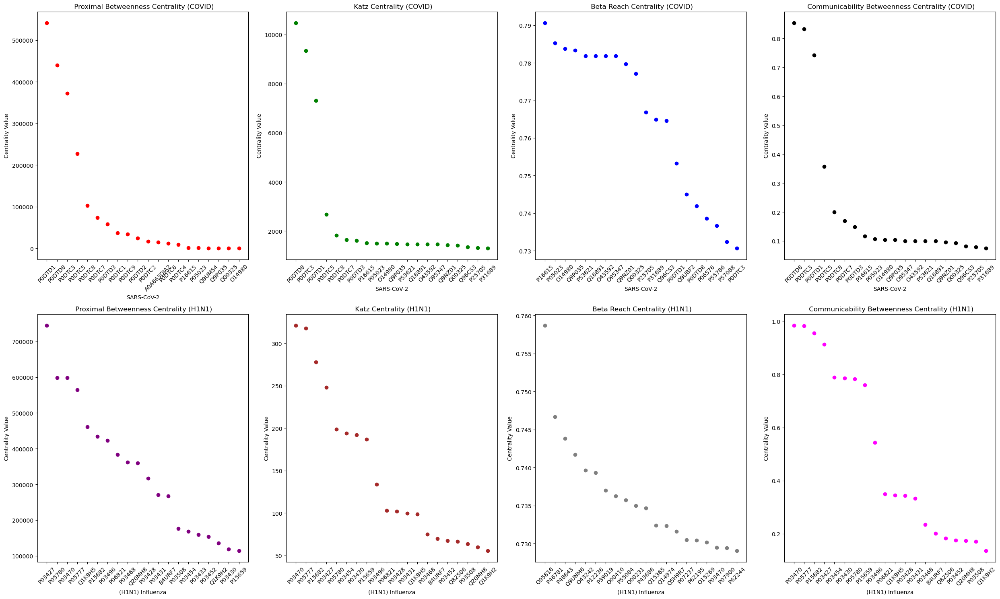

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

# Load node labels for COVID and H1N1
covid_node_labels = pd.read_excel("datasets/corona_nodes.xlsx")
h1n1_node_labels = pd.read_excel("datasets/influenza_nodes.xlsx")

# Load centrality data for the two graphs and centrality measures
covid_proximal_betweenness_data = pd.read_excel("outputs/corona_centrality_measures/proximal_betweenness.xlsx")
h1n1_proximal_betweenness_data = pd.read_excel("outputs/influenza_centrality_measures/proximal_betweenness.xlsx")

covid_katz_centrality_data = pd.read_excel("outputs/corona_centrality_measures/katz_centrality.xlsx")
h1n1_katz_centrality_data = pd.read_excel("outputs/influenza_centrality_measures/katz_centrality.xlsx")

covid_beta_reach_centrality_data = pd.read_excel("outputs/corona_centrality_measures/beta_reach_centrality.xlsx")
h1n1_beta_reach_centrality_data = pd.read_excel("outputs/influenza_centrality_measures/beta_reach_centrality.xlsx")

covid_communicability_betweenness_data = pd.read_excel("outputs/corona_centrality_measures/communicability_betweenness_centrality.xlsx")
h1n1_communicability_betweenness_data = pd.read_excel("outputs/influenza_centrality_measures/communicability_betweenness_centrality.xlsx")

# Merge node labels with centrality data
covid_proximal_betweenness_data = covid_proximal_betweenness_data.merge(covid_node_labels, on='Node')
h1n1_proximal_betweenness_data = h1n1_proximal_betweenness_data.merge(h1n1_node_labels, on='Node')
covid_katz_centrality_data = covid_katz_centrality_data.merge(covid_node_labels, on='Node')
h1n1_katz_centrality_data = h1n1_katz_centrality_data.merge(h1n1_node_labels, on='Node')
covid_beta_reach_centrality_data = covid_beta_reach_centrality_data.merge(covid_node_labels, on='Node')
h1n1_beta_reach_centrality_data = h1n1_beta_reach_centrality_data.merge(h1n1_node_labels, on='Node')
covid_communicability_betweenness_data = covid_communicability_betweenness_data.merge(covid_node_labels, on='Node')
h1n1_communicability_betweenness_data = h1n1_communicability_betweenness_data.merge(h1n1_node_labels, on='Node')

# Choose the top number of nodes to visualize
num_top_nodes = 20

# Create subplots for each centrality measure
plt.figure(figsize=(25, 15))

# COVID Proximal Betweenness Centrality
plt.subplot(2, 4, 1)
top_nodes_covid_proximal_betweenness = covid_proximal_betweenness_data.nlargest(num_top_nodes, 'proximal_betweenness')
plt.scatter(top_nodes_covid_proximal_betweenness['corona_nodes'], top_nodes_covid_proximal_betweenness['proximal_betweenness'], color='red')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title(' Proximal Betweenness Centrality (COVID)')
plt.xticks(rotation=45)

# COVID Katz Centrality
plt.subplot(2, 4, 2)
top_nodes_covid_katz_centrality = covid_katz_centrality_data.nlargest(num_top_nodes, 'katz_centrality')
plt.scatter(top_nodes_covid_katz_centrality['corona_nodes'], top_nodes_covid_katz_centrality['katz_centrality'], color='green')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title(' Katz Centrality (COVID)')
plt.xticks(rotation=45)

# COVID Beta Reach Centrality
plt.subplot(2, 4, 3)
top_nodes_covid_beta_reach_centrality = covid_beta_reach_centrality_data.nlargest(num_top_nodes, 'beta_reach_centrality')
plt.scatter(top_nodes_covid_beta_reach_centrality['corona_nodes'], top_nodes_covid_beta_reach_centrality['beta_reach_centrality'], color='blue')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title(' Beta Reach Centrality (COVID)')
plt.xticks(rotation=45)

# COVID Communicability Betweenness Centrality
plt.subplot(2, 4, 4)
top_nodes_covid_communicability_betweenness = covid_communicability_betweenness_data.nlargest(num_top_nodes, 'communicability_betweenness_centrality')
plt.scatter(top_nodes_covid_communicability_betweenness['corona_nodes'], top_nodes_covid_communicability_betweenness['communicability_betweenness_centrality'], color='black')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title(' Communicability Betweenness Centrality (COVID)')
plt.xticks(rotation=45)

# H1N1 Proximal Betweenness Centrality
plt.subplot(2, 4, 5)
top_nodes_h1n1_proximal_betweenness = h1n1_proximal_betweenness_data.nlargest(num_top_nodes, 'proximal_betweenness')
plt.scatter(top_nodes_h1n1_proximal_betweenness['influenza_nodes'], top_nodes_h1n1_proximal_betweenness['proximal_betweenness'], color='purple')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Proximal Betweenness Centrality (H1N1)')
plt.xticks(rotation=45)

# H1N1 Katz Centrality
plt.subplot(2, 4, 6)
top_nodes_h1n1_katz_centrality = h1n1_katz_centrality_data.nlargest(num_top_nodes, 'katz_centrality')
plt.scatter(top_nodes_h1n1_katz_centrality['influenza_nodes'], top_nodes_h1n1_katz_centrality['katz_centrality'], color='brown')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Katz Centrality (H1N1)')
plt.xticks(rotation=45)

# H1N1 Beta Reach Centrality
plt.subplot(2, 4, 7)
top_nodes_h1n1_beta_reach_centrality = h1n1_beta_reach_centrality_data.nlargest(num_top_nodes, 'beta_reach_centrality')
plt.scatter(top_nodes_h1n1_beta_reach_centrality['influenza_nodes'], top_nodes_h1n1_beta_reach_centrality['beta_reach_centrality'], color='gray')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Beta Reach Centrality (H1N1)')
plt.xticks(rotation=45)

# H1N1 Communicability Betweenness Centrality
plt.subplot(2, 4, 8)
top_nodes_h1n1_communicability_betweenness = h1n1_communicability_betweenness_data.nlargest(num_top_nodes, 'communicability_betweenness_centrality')
plt.scatter(top_nodes_h1n1_communicability_betweenness['influenza_nodes'], top_nodes_h1n1_communicability_betweenness['communicability_betweenness_centrality'], color='magenta')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Communicability Betweenness Centrality (H1N1)')
plt.xticks(rotation=45)

plt.tight_layout()

# Save the combined image
combined_filename = "figures/centrality_measures/6.png"
plt.savefig(combined_filename, dpi=300, bbox_inches='tight')
plt.show()

In [10]:
import pandas as pd

# Read the Excel files
c_sheet1_df = pd.read_csv("datasets/corona_edges.csv")
c_sheet2_df = pd.read_excel("datasets/corona_nodes.xlsx")

i_sheet1_df = pd.read_csv("datasets/influenza_edges.csv")
i_sheet2_df = pd.read_excel("datasets/influenza_nodes.xlsx")

# Create a dictionary mapping values from Sheet 1 to values from Sheet 2

c_mapping_dict = dict(zip(c_sheet2_df["Node"], c_sheet2_df["corona_nodes"]))
i_mapping_dict = dict(zip(i_sheet2_df["Node"], i_sheet2_df["influenza_nodes"]))

# Replace values in Sheet 1 using the mapping dictionary

c_sheet1_df["V1"] = c_sheet1_df["V1"].map(c_mapping_dict)
c_sheet1_df["V2"] = c_sheet1_df["V2"].map(c_mapping_dict)

i_sheet1_df["V1"] = i_sheet1_df["V1"].map(i_mapping_dict)
i_sheet1_df["V2"] = i_sheet1_df["V2"].map(i_mapping_dict)

# Save the modified DataFrame back to the Excel file or to a new file
c_sheet1_df.to_excel("datasets/corona_edges_modified.xlsx", index=False)
i_sheet1_df.to_excel("datasets/influenza_edges_modified.xlsx", index=False)

In [ ]:
import networkx as nx
import pandas as pd

corona_edge_data = pd.read_excel("datasets/corona_edges_modified.xlsx"  )
influenza_edge_data = pd.read_excel("datasets/influenza_edges_modified.xlsx"  )

C = nx.Graph().to_undirected()
I = nx.Graph().to_undirected()

c_edges = list(zip(corona_edge_data["V1"], corona_edge_data["V2"]))
C.add_edges_from(c_edges)
i_edges = list(zip(influenza_edge_data["V1"], influenza_edge_data["V2"]))
I.add_edges_from(i_edges)


# Calculate centrality measures

c_edge_betweenness_centrality=nx.edge_betweenness_centrality(C)
c_edge_load_centrality=nx.edge_load_centrality(C)
c_edge_current_flow_betweenness_centrality=nx.edge_current_flow_betweenness_centrality(C)

i_edge_betweenness_centrality=nx.edge_betweenness_centrality(I)
i_edge_load_centrality=nx.edge_load_centrality(I)
i_edge_current_flow_betweenness_centrality=nx.edge_current_flow_betweenness_centrality(I)



# Store each centrality function in separate Excel files, sorted by centrality values

c_centrality_functions = {
    "edge_betweenness_centrality_modified": c_edge_betweenness_centrality,
    "edge_load_centrality_modified": c_edge_load_centrality,
    "edge_current_flow_betweenness_centrality_modified": c_edge_current_flow_betweenness_centrality
}

i_centrality_functions = {
    "edge_betweenness_centrality_modified": i_edge_betweenness_centrality,
    "edge_load_centrality_modified": i_edge_load_centrality,
    "edge_current_flow_betweenness_centrality_modified": i_edge_current_flow_betweenness_centrality
}

for centrality_name, centrality_data in c_centrality_functions.items():
    sorted_data = sorted(centrality_data.items(), key=lambda x: x[1], reverse=True)
    df = pd.DataFrame(sorted_data, columns=["Node", centrality_name])
    excel_file_name = f"{centrality_name}.xlsx"
    excel_file_path = "outputs/corona_centrality_measures/modified/" + excel_file_name
    df.to_excel(excel_file_path, index=False)
    print(f"{centrality_name} data saved to {excel_file_name}")

for centrality_name, centrality_data in i_centrality_functions.items():
    sorted_data = sorted(centrality_data.items(), key=lambda x: x[1], reverse=True)
    df = pd.DataFrame(sorted_data, columns=["Node", centrality_name])
    excel_file_name = f"{centrality_name}.xlsx"
    excel_file_path = "outputs/influenza_centrality_measures/modified/" + excel_file_name
    df.to_excel(excel_file_path, index=False)
    print(f"{centrality_name} data saved to {excel_file_name}")


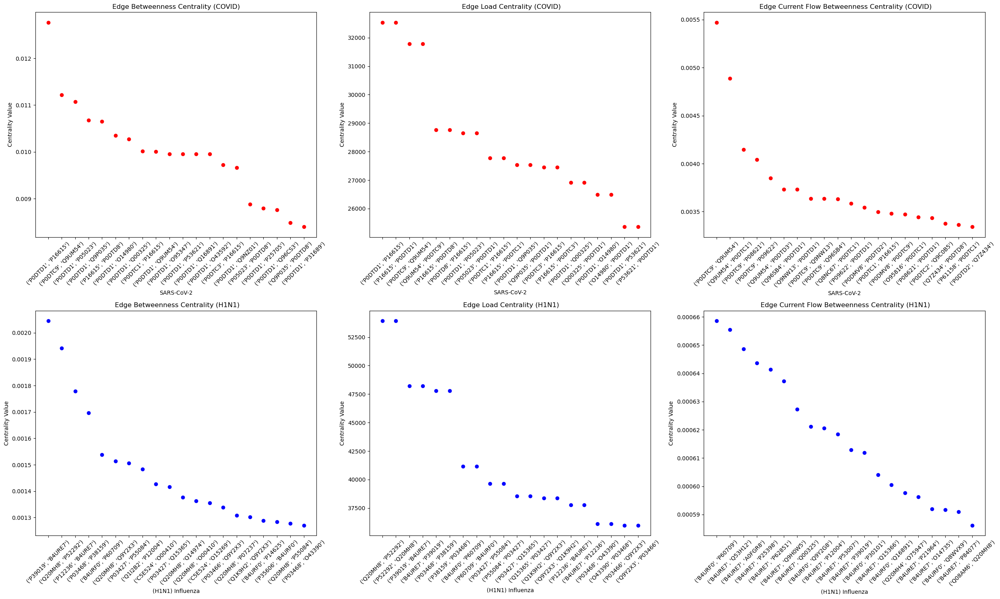

In [16]:
import pandas as pd
import matplotlib.pyplot as plt

# Load centrality data from Excel for the two graphs and centrality measures
covid_edge_betweenness_centrality = pd.read_excel("outputs/corona_centrality_measures/modified/edge_betweenness_centrality_modified.xlsx") 
h1n1_edge_betweenness_centrality = pd.read_excel("outputs/influenza_centrality_measures/modified/edge_betweenness_centrality_modified.xlsx")

covid_edge_load_centrality = pd.read_excel("outputs/corona_centrality_measures/modified/edge_load_centrality_modified.xlsx") 
h1n1_edge_load_centrality = pd.read_excel("outputs/influenza_centrality_measures/modified/edge_load_centrality_modified.xlsx")

covid_edge_current_flow_betweenness_centrality = pd.read_excel("outputs/corona_centrality_measures/modified/edge_current_flow_betweenness_centrality_modified.xlsx")  # Replace with your file paths
h1n1_edge_current_flow_betweenness_centrality = pd.read_excel("outputs/influenza_centrality_measures/modified/edge_current_flow_betweenness_centrality_modified.xlsx")

# Choose the top number of nodes to visualize
num_top_nodes = 20

# Plot each centrality measure side by side
plt.figure(figsize=(25, 15))

# COVID Edge Betweenness Centrality
plt.subplot(2, 3, 1)
covid_edge_betweenness_centrality = covid_edge_betweenness_centrality.nlargest(num_top_nodes, 'edge_betweenness_centrality')
plt.scatter(covid_edge_betweenness_centrality['Node'], covid_edge_betweenness_centrality['edge_betweenness_centrality'], color='red')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title('Edge Betweenness Centrality (COVID)')
plt.xticks(rotation=45)

# COVID Edge Load Centrality
plt.subplot(2, 3, 2)
covid_edge_load_centrality = covid_edge_load_centrality.nlargest(num_top_nodes, 'edge_load_centrality')
plt.scatter(covid_edge_load_centrality['Node'], covid_edge_load_centrality['edge_load_centrality'], color='red')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title(' Edge Load Centrality (COVID)')
plt.xticks(rotation=45)

# COVID Edge Current Flow Betweenness Centrality
plt.subplot(2, 3, 3)
covid_edge_current_flow_betweenness_centrality = covid_edge_current_flow_betweenness_centrality.nlargest(num_top_nodes, 'edge_current_flow_betweenness_centrality')
plt.scatter(covid_edge_current_flow_betweenness_centrality['Node'], covid_edge_current_flow_betweenness_centrality['edge_current_flow_betweenness_centrality'], color='red')
plt.xlabel('SARS-CoV-2')
plt.ylabel('Centrality Value')
plt.title(' Edge Current Flow Betweenness Centrality (COVID)')
plt.xticks(rotation=45)

# H1N1 Edge Betweenness Centrality
plt.subplot(2, 3, 4)
h1n1_edge_betweenness_centrality = h1n1_edge_betweenness_centrality.nlargest(num_top_nodes, 'edge_betweenness_centrality')
plt.scatter(h1n1_edge_betweenness_centrality['Node'], h1n1_edge_betweenness_centrality['edge_betweenness_centrality'], color='blue')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Edge Betweenness Centrality (H1N1)')
plt.xticks(rotation=45)

# H1N1 Edge Load Centrality
plt.subplot(2, 3, 5)
h1n1_edge_load_centrality = h1n1_edge_load_centrality.nlargest(num_top_nodes, 'edge_load_centrality')
plt.scatter(h1n1_edge_load_centrality['Node'], h1n1_edge_load_centrality['edge_load_centrality'], color='blue')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Edge Load Centrality (H1N1)')
plt.xticks(rotation=45)

# H1N1 Edge Current Flow Betweenness Centrality
plt.subplot(2, 3, 6)
h1n1_edge_current_flow_betweenness_centrality = h1n1_edge_current_flow_betweenness_centrality.nlargest(num_top_nodes, 'edge_current_flow_betweenness_centrality')
plt.scatter(h1n1_edge_current_flow_betweenness_centrality['Node'], h1n1_edge_current_flow_betweenness_centrality['edge_current_flow_betweenness_centrality'], color='blue')
plt.xlabel('(H1N1) Influenza')
plt.ylabel('Centrality Value')
plt.title(' Edge Current Flow Betweenness Centrality (H1N1)')
plt.xticks(rotation=45)

# Save the combined image
combined_filename = "figures/centrality_measures/7.png"
plt.savefig(combined_filename, dpi=300, bbox_inches='tight')

plt.tight_layout()
plt.show()

# Merging Centrality Data 

In [19]:
import pandas as pd

corona = pd.read_excel("datasets/corona_nodes.xlsx")
influenza = pd.read_excel("datasets/influenza_nodes.xlsx")

corona_eig = pd.read_excel("outputs/corona_centrality_measures/eigenvector_centrality.xlsx")  
corona_eig = corona_eig.sort_values(by=['Node'],ascending=True)
influenza_eig = pd.read_excel("outputs/influenza_centrality_measures/eigenvector_centrality.xlsx")  
influenza_eig = influenza_eig.sort_values(by=['Node'],ascending=True)

corona_eignp = pd.read_excel("outputs/corona_centrality_measures/eigenvector_centrality_numpy.xlsx")  
corona_eignp = corona_eignp.sort_values(by=['Node'],ascending=True)
influenza_eignp = pd.read_excel("outputs/influenza_centrality_measures/eigenvector_centrality_numpy.xlsx")  
influenza_eignp = influenza_eignp.sort_values(by=['Node'],ascending=True)

corona_sub = pd.read_excel("outputs/corona_centrality_measures/subgraph_centrality.xlsx")  
corona_sub = corona_sub.sort_values(by=['Node'],ascending=True)
influenza_sub = pd.read_excel("outputs/influenza_centrality_measures/subgraph_centrality.xlsx")  
influenza_sub = influenza_sub.sort_values(by=['Node'],ascending=True)

corona_katznp = pd.read_excel("outputs/corona_centrality_measures/katz_centrality_numpy.xlsx")  
corona_katznp = corona_katznp.sort_values(by=['Node'],ascending=True)
influenza_katznp = pd.read_excel("outputs/influenza_centrality_measures/katz_centrality_numpy.xlsx")  
influenza_katznp = influenza_katznp.sort_values(by=['Node'],ascending=True)

corona_subexp = pd.read_excel("outputs/corona_centrality_measures/subgraph_centrality_exp.xlsx")
corona_subexp = corona_subexp.sort_values(by=['Node'],ascending=True)
influenza_subexp = pd.read_excel("outputs/influenza_centrality_measures/subgraph_centrality_exp.xlsx")
influenza_subexp = influenza_subexp.sort_values(by=['Node'],ascending=True)

corona_deg = pd.read_excel("outputs/corona_centrality_measures/degree_centrality.xlsx")
corona_deg = corona_deg.sort_values(by=['Node'],ascending=True)
influenza_deg = pd.read_excel("outputs/influenza_centrality_measures/degree_centrality.xlsx")
influenza_deg = influenza_deg.sort_values(by=['Node'],ascending=True)

corona_lap = pd.read_excel("outputs/corona_centrality_measures/laplacian_centrality.xlsx")
corona_lap = corona_lap.sort_values(by=['Node'],ascending=True)
influenza_lap = pd.read_excel("outputs/influenza_centrality_measures/laplacian_centrality.xlsx")
influenza_lap = influenza_lap.sort_values(by=['Node'],ascending=True)

corona_clo = pd.read_excel("outputs/corona_centrality_measures/closeness_centrality.xlsx")
corona_clo = corona_clo.sort_values(by=['Node'],ascending=True)
influenza_clo = pd.read_excel("outputs/influenza_centrality_measures/closeness_centrality.xlsx")
influenza_clo = influenza_clo.sort_values(by=['Node'],ascending=True)

corona_har = pd.read_excel("outputs/corona_centrality_measures/harmonic_centrality.xlsx")
corona_har = corona_har.sort_values(by=['Node'],ascending=True)
influenza_har = pd.read_excel("outputs/influenza_centrality_measures/harmonic_centrality.xlsx")
influenza_har = influenza_har.sort_values(by=['Node'],ascending=True)

corona_bet = pd.read_excel("outputs/corona_centrality_measures/betweenness_centrality.xlsx")
corona_bet = corona_bet.sort_values(by=['Node'],ascending=True)
influenza_bet = pd.read_excel("outputs/influenza_centrality_measures/betweenness_centrality.xlsx")
influenza_bet = influenza_bet.sort_values(by=['Node'],ascending=True)

corona_dec = pd.read_excel("outputs/corona_centrality_measures/decay_centrality.xlsx")
corona_dec = corona_dec.sort_values(by=['Node'],ascending=True)
influenza_dec = pd.read_excel("outputs/influenza_centrality_measures/decay_centrality.xlsx")
influenza_dec = influenza_dec.sort_values(by=['Node'],ascending=True)

corona_ecc = pd.read_excel("outputs/corona_centrality_measures/eccentricity.xlsx")
corona_ecc = corona_ecc.sort_values(by=['Node'],ascending=True)
influenza_ecc = pd.read_excel("outputs/influenza_centrality_measures/eccentricity.xlsx")
influenza_ecc = influenza_ecc.sort_values(by=['Node'],ascending=True)

corona_rad = pd.read_excel("outputs/corona_centrality_measures/radiality_centrality.xlsx")
corona_rad = corona_rad.sort_values(by=['Node'],ascending=True)
influenza_rad = pd.read_excel("outputs/influenza_centrality_measures/radiality_centrality.xlsx")
influenza_rad = influenza_rad.sort_values(by=['Node'],ascending=True)

corona_cfc = pd.read_excel("outputs/corona_centrality_measures/current_flow_closeness_centrality.xlsx")
corona_cfc = corona_cfc.sort_values(by=['Node'],ascending=True)
influenza_cfc = pd.read_excel("outputs/influenza_centrality_measures/current_flow_closeness_centrality.xlsx")
influenza_cfc = influenza_cfc.sort_values(by=['Node'],ascending=True)

corona_cfcinfo = pd.read_excel("outputs/corona_centrality_measures/information_centrality.xlsx")
corona_cfcinfo = corona_cfcinfo.sort_values(by=['Node'],ascending=True)
influenza_cfcinfo = pd.read_excel("outputs/influenza_centrality_measures/information_centrality.xlsx")
influenza_cfcinfo = influenza_cfcinfo.sort_values(by=['Node'],ascending=True)

corona_cfb = pd.read_excel("outputs/corona_centrality_measures/current_flow_betweenness_centrality.xlsx")
corona_cfb = corona_cfb.sort_values(by=['Node'],ascending=True)
influenza_cfb = pd.read_excel("outputs/influenza_centrality_measures/current_flow_betweenness_centrality.xlsx")
influenza_cfb = influenza_cfb.sort_values(by=['Node'],ascending=True)

corona_acf = pd.read_excel("outputs/corona_centrality_measures/approximate_current_flow_betweenness_centrality.xlsx")
corona_acf = corona_acf.sort_values(by=['Node'],ascending=True)
influenza_acf = pd.read_excel("outputs/influenza_centrality_measures/approximate_current_flow_betweenness_centrality.xlsx")
influenza_acf = influenza_acf.sort_values(by=['Node'],ascending=True)

corona_cbc = pd.read_excel("outputs/corona_centrality_measures/communicability_betweenness_centrality.xlsx")
corona_cbc = corona_cbc.sort_values(by=['Node'],ascending=True)
influenza_cbc = pd.read_excel("outputs/influenza_centrality_measures/communicability_betweenness_centrality.xlsx")
influenza_cbc = influenza_cbc.sort_values(by=['Node'],ascending=True)

corona_lc = pd.read_excel("outputs/corona_centrality_measures/load_centrality.xlsx")
corona_lc = corona_lc.sort_values(by=['Node'],ascending=True)
influenza_lc = pd.read_excel("outputs/influenza_centrality_measures/load_centrality.xlsx")
influenza_lc = influenza_lc.sort_values(by=['Node'],ascending=True)

corona_pr = pd.read_excel("outputs/corona_centrality_measures/pagerank.xlsx")
corona_pr = corona_pr.sort_values(by=['Node'],ascending=True)
influenza_pr = pd.read_excel("outputs/influenza_centrality_measures/pagerank.xlsx")
influenza_pr = influenza_pr.sort_values(by=['Node'],ascending=True)

corona_soc = pd.read_excel("outputs/corona_centrality_measures/second_order_centrality.xlsx")
corona_soc = corona_soc.sort_values(by=['Node'],ascending=True)
influenza_soc = pd.read_excel("outputs/influenza_centrality_measures/second_order_centrality.xlsx")
influenza_soc = influenza_soc.sort_values(by=['Node'],ascending=True)

corona_pb = pd.read_excel("outputs/corona_centrality_measures/proximal_betweenness.xlsx")
influenza_pb = pd.read_excel("outputs/influenza_centrality_measures/proximal_betweenness.xlsx")

corona_katz = pd.read_excel("outputs/corona_centrality_measures/katz_centrality.xlsx")
influenza_katz = pd.read_excel("outputs/influenza_centrality_measures/katz_centrality.xlsx")

corona_brc = pd.read_excel("outputs/corona_centrality_measures/beta_reach_centrality.xlsx")
influenza_brc = pd.read_excel("outputs/influenza_centrality_measures/beta_reach_centrality.xlsx")




corona_dt = corona.merge(corona_eig)
corona_dt = corona_dt.merge(corona_eignp)
corona_dt = corona_dt.merge(corona_sub)
corona_dt = corona_dt.merge(corona_katznp)
corona_dt = corona_dt.merge(corona_subexp)
corona_dt = corona_dt.merge(corona_deg)
corona_dt = corona_dt.merge(corona_lap)
corona_dt = corona_dt.merge(corona_clo)
corona_dt = corona_dt.merge(corona_har)
corona_dt = corona_dt.merge(corona_bet)
corona_dt = corona_dt.merge(corona_dec)
corona_dt = corona_dt.merge(corona_ecc)
corona_dt = corona_dt.merge(corona_rad)
corona_dt = corona_dt.merge(corona_cfc)
corona_dt = corona_dt.merge(corona_cfcinfo)
corona_dt = corona_dt.merge(corona_cfb)
corona_dt = corona_dt.merge(corona_acf)
corona_dt = corona_dt.merge(corona_cbc)
corona_dt = corona_dt.merge(corona_lc)
corona_dt = corona_dt.merge(corona_pr)
corona_dt = corona_dt.merge(corona_soc)
corona_dt = corona_dt.merge(corona_pb)
corona_dt = corona_dt.merge(corona_katz)
corona_dt = corona_dt.merge(corona_brc)

influenza_dt = influenza.merge(influenza_eig)
influenza_dt = influenza_dt.merge(influenza_eignp)
influenza_dt = influenza_dt.merge(influenza_sub)
influenza_dt = influenza_dt.merge(influenza_katznp)
influenza_dt = influenza_dt.merge(influenza_subexp)
influenza_dt = influenza_dt.merge(influenza_deg)
influenza_dt = influenza_dt.merge(influenza_lap)
influenza_dt = influenza_dt.merge(influenza_clo)
influenza_dt = influenza_dt.merge(influenza_har)
influenza_dt = influenza_dt.merge(influenza_bet)
influenza_dt = influenza_dt.merge(influenza_dec)
influenza_dt = influenza_dt.merge(influenza_ecc)
influenza_dt = influenza_dt.merge(influenza_rad)
influenza_dt = influenza_dt.merge(influenza_cfc)
influenza_dt = influenza_dt.merge(influenza_cfcinfo)
influenza_dt = influenza_dt.merge(influenza_cfb)
influenza_dt = influenza_dt.merge(influenza_acf)
influenza_dt = influenza_dt.merge(influenza_cbc)
influenza_dt = influenza_dt.merge(influenza_lc)
influenza_dt = influenza_dt.merge(influenza_pr)
influenza_dt = influenza_dt.merge(influenza_soc)
influenza_dt = influenza_dt.merge(influenza_pb)
influenza_dt = influenza_dt.merge(influenza_katz)
influenza_dt = influenza_dt.merge(influenza_brc)
corona_dt.to_excel('outputs/corona_centrality_measures/corona_data_for_analysis/corona_centrality_data.xlsx',index=False)
influenza_dt.to_excel('outputs/influenza_centrality_measures/influenza_data_for_analysis/influenza_centrality_data.xlsx',index=False)
corona_dt.head()

,Node,corona_nodes,eigenvector_centrality,eigenvector_centrality_numpy,subgraph_centrality,katz_centrality_numpy,subgraph_centrality_exp,degree_centrality,laplacian_centrality,closeness_centrality,...,information_centrality,current_flow_betweenness_centrality,approximate_current_flow_betweenness_centrality,communicability_betweenness_centrality,load_centrality,pagerank,second_order_centrality,proximal_betweenness,katz_centrality,beta_reach_centrality
0,1,Q9BYF1,0.000497,0.000497,8.916286e+03,0.041131,8.916286e+03,0.00071,0.000103,0.241924,...,0.000361,0.000000e+00,0.0,0.000038,0.0,0.000300,43438.751410,1.0,11.569667,0.502077
1,2,O75347,0.000481,0.000481,7.694549e+03,0.045460,7.694549e+03,0.00071,0.000130,0.253968,...,0.000354,0.000000e+00,0.0,0.000072,0.0,0.000326,44162.304288,1.0,11.193433,0.520895
2,3,Q92769,0.013018,0.013018,6.216768e+06,0.000179,6.216768e+06,0.00071,0.001504,0.296796,...,0.000377,1.147740e-19,0.0,0.005358,0.0,0.000324,41773.245272,1.0,301.187439,0.602718
3,4,O15226,0.013018,0.013018,6.216768e+06,0.000179,6.216768e+06,0.00071,0.001504,0.296796,...,0.000377,1.147740e-19,0.0,0.005358,0.0,0.000324,41773.245272,1.0,301.187439,0.602718
4,5,Q53GL7,0.013018,0.013018,6.216768e+06,0.000179,6.216768e+06,0.00071,0.001504,0.296796,...,0.000377,1.147740e-19,0.0,0.005358,0.0,0.000324,41773.245272,1.0,301.187439,0.602718


# Scaling data for both dataset

In [20]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

corona_dt = pd.read_excel("outputs/corona_centrality_measures/corona_data_for_analysis/corona_centrality_data.xlsx")
influenza_dt = pd.read_excel("outputs/influenza_centrality_measures/influenza_data_for_analysis/influenza_centrality_data.xlsx")

corona_column_names = [column for column in corona_dt.columns if column not in ['Node', 'corona_nodes']]
influenza_column_names = [column for column in influenza_dt.columns if column not in ['Node', 'influenza_nodes']]
scaler = StandardScaler()

corona_scaled_columns = scaler.fit_transform(corona_dt[corona_column_names])
influenza_scaled_columns = scaler.fit_transform(influenza_dt[influenza_column_names])


corona_scaled_df = pd.DataFrame(corona_scaled_columns, columns=corona_column_names)
influenza_scaled_df = pd.DataFrame(influenza_scaled_columns, columns=influenza_column_names)

corona_scaled_df['Node'] = corona_dt['Node']
corona_scaled_df['corona_nodes'] = corona_dt['corona_nodes']
influenza_scaled_df['Node'] = influenza_dt['Node']
influenza_scaled_df['influenza_nodes'] = influenza_dt['influenza_nodes']


corona_scaled_df = corona_scaled_df[['Node', 'corona_nodes'] + corona_column_names]
influenza_scaled_df = influenza_scaled_df[['Node', 'influenza_nodes'] + influenza_column_names]

corona_scaled_df.to_excel("outputs/corona_centrality_measures/corona_data_for_analysis/corona_centrality_scaled_data.xlsx",index=False)
influenza_scaled_df.to_excel("outputs/influenza_centrality_measures/influenza_data_for_analysis/influenza_centrality_scaled_data.xlsx",index=False)

corona_scaled_df

,Node,corona_nodes,eigenvector_centrality,eigenvector_centrality_numpy,subgraph_centrality,katz_centrality_numpy,subgraph_centrality_exp,degree_centrality,laplacian_centrality,closeness_centrality,...,information_centrality,current_flow_betweenness_centrality,approximate_current_flow_betweenness_centrality,communicability_betweenness_centrality,load_centrality,pagerank,second_order_centrality,proximal_betweenness,katz_centrality,beta_reach_centrality
0,1,Q9BYF1,-0.757759,-0.757789,-0.095239,1.447048,-0.095239,-0.086065,-0.150488,-1.461197,...,-0.677819,-0.109939,-0.108612,-0.251173,-0.092670,-0.083891,0.717855,-0.063257,-0.757616,-1.705520
1,2,O75347,-0.758545,-0.758575,-0.095244,1.610454,-0.095244,-0.086065,-0.148438,-1.096229,...,-0.757996,-0.109939,-0.108612,-0.250341,-0.092670,-0.078524,0.819675,-0.063257,-0.758392,-1.332929
2,3,Q92769,-0.161305,-0.161309,-0.070507,-0.098659,-0.070507,-0.086065,-0.045949,0.201590,...,-0.487025,-0.109939,-0.108612,-0.120188,-0.092670,-0.078855,0.483479,-0.063257,-0.160089,0.287149
3,4,O15226,-0.161305,-0.161309,-0.070507,-0.098659,-0.070507,-0.086065,-0.045949,0.201590,...,-0.487025,-0.109939,-0.108612,-0.120188,-0.092670,-0.078855,0.483479,-0.063257,-0.160089,0.287149
4,5,Q53GL7,-0.161305,-0.161309,-0.070507,-0.098659,-0.070507,-0.086065,-0.045949,0.201590,...,-0.487025,-0.109939,-0.108612,-0.120188,-0.092670,-0.078855,0.483479,-0.063257,-0.160089,0.287149
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1404,1405,P0DTC3,18.484363,18.484075,21.510541,-7.553984,21.510541,18.041504,17.129165,3.291248,...,4.680933,17.679665,22.227040,20.231856,16.323973,17.468397,-4.890924,16.678745,18.477397,2.820716
1405,1406,A0A663DJA2,0.919341,0.919287,0.072917,-3.861660,0.072917,1.308363,-0.012896,1.216382,...,4.092419,1.208847,0.560497,0.835115,0.690135,1.071840,-3.908859,0.595186,0.920668,1.020965
1406,1407,P0DTC7,2.598578,2.598503,0.571011,-8.918928,0.571011,4.844235,1.211591,1.561257,...,4.497946,4.862687,3.973130,3.935428,3.627878,4.251497,-4.480634,3.266717,2.606237,1.380384
1407,1408,P0DTD3,2.526453,2.526379,0.543227,-4.771059,0.543227,4.147021,0.866972,1.771456,...,4.496569,5.040052,6.652031,3.398798,3.129691,3.601351,-4.478196,2.573716,2.532141,1.490150


# Forming Dissimilarity Matrix

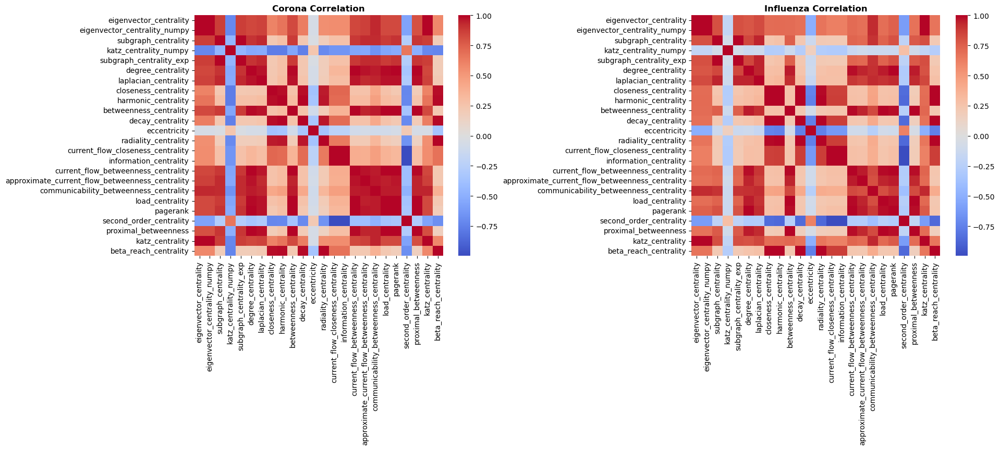

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
corona_scaled = pd.read_excel("outputs/corona_centrality_measures/corona_data_for_analysis/corona_centrality_scaled_data.xlsx")
influenza_scaled = pd.read_excel("outputs/influenza_centrality_measures/influenza_data_for_analysis/influenza_centrality_scaled_data.xlsx")

corona_scaled = corona_scaled.drop(['Node', 'corona_nodes'], axis=1)
influenza_scaled = influenza_scaled.drop(['Node', 'influenza_nodes'], axis=1)

corona_correlation = corona_scaled.corr()
influenza_correlation = influenza_scaled.corr()

fig, axs = plt.subplots(1, 2, figsize=(20, 6))

# Plot the corona correlation
axs[0].set_title('Corona Correlation',fontweight='bold')
sns.heatmap(corona_correlation, annot=False, cmap='coolwarm', ax=axs[0], linewidths=0)

# Plot the influenza correlation
axs[1].set_title('Influenza Correlation',fontweight='bold')
sns.heatmap(influenza_correlation, annot=False, cmap='coolwarm', ax=axs[1],linewidths=0)
plt.subplots_adjust(wspace=0.6)

combined_filename = "figures/dissimilarity_matrix_for_corona_and_influenza.png"
plt.savefig(combined_filename, dpi=300, bbox_inches='tight')


plt.show()

In [22]:
print(corona_scaled['eigenvector_centrality'].corr(corona_scaled['eigenvector_centrality_numpy']))

0.9999999996507797


# Scatter and Violin plot with Pearson Correlation Coefficient values

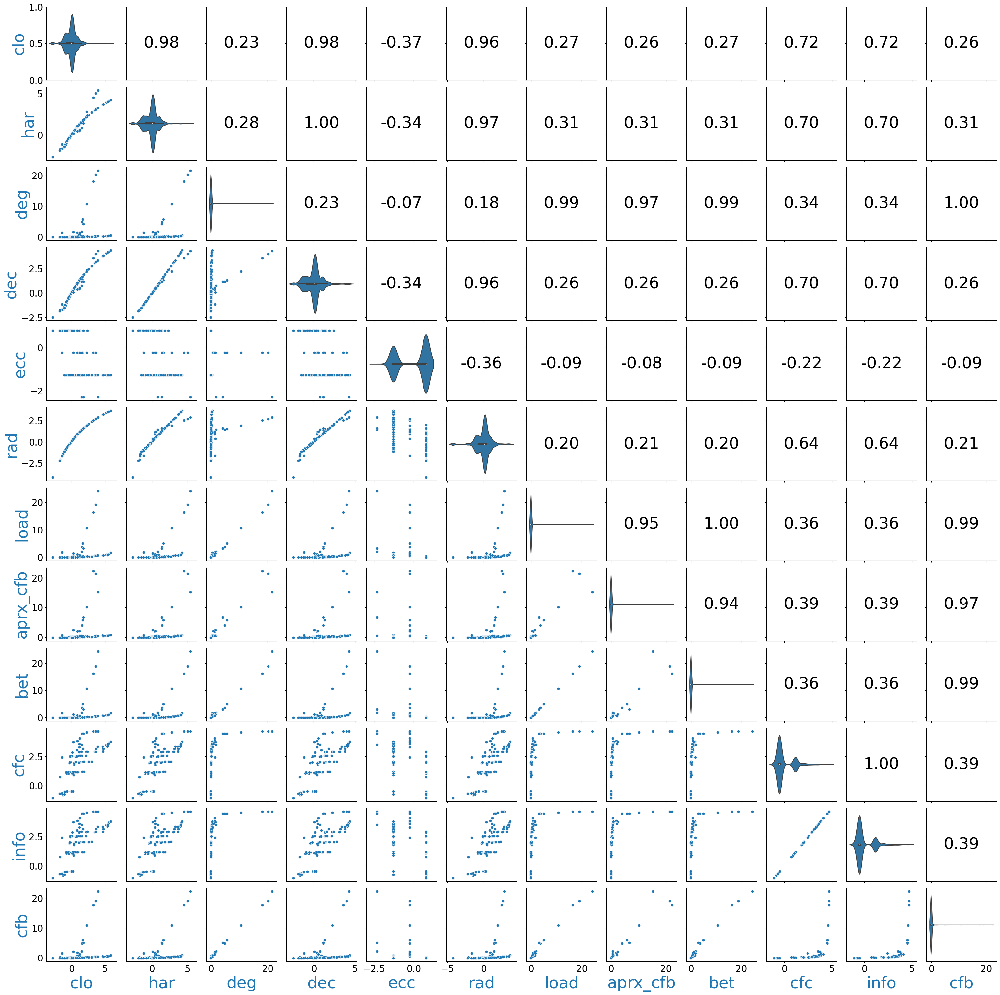

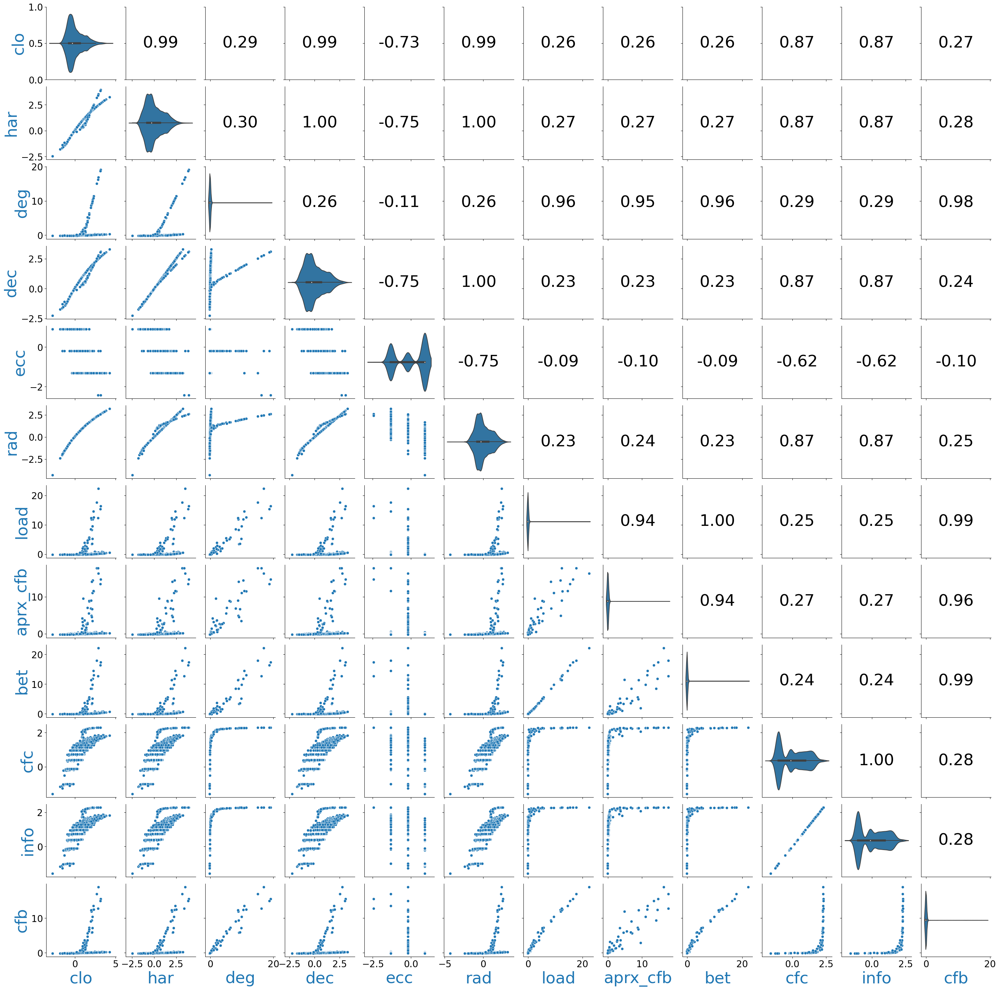

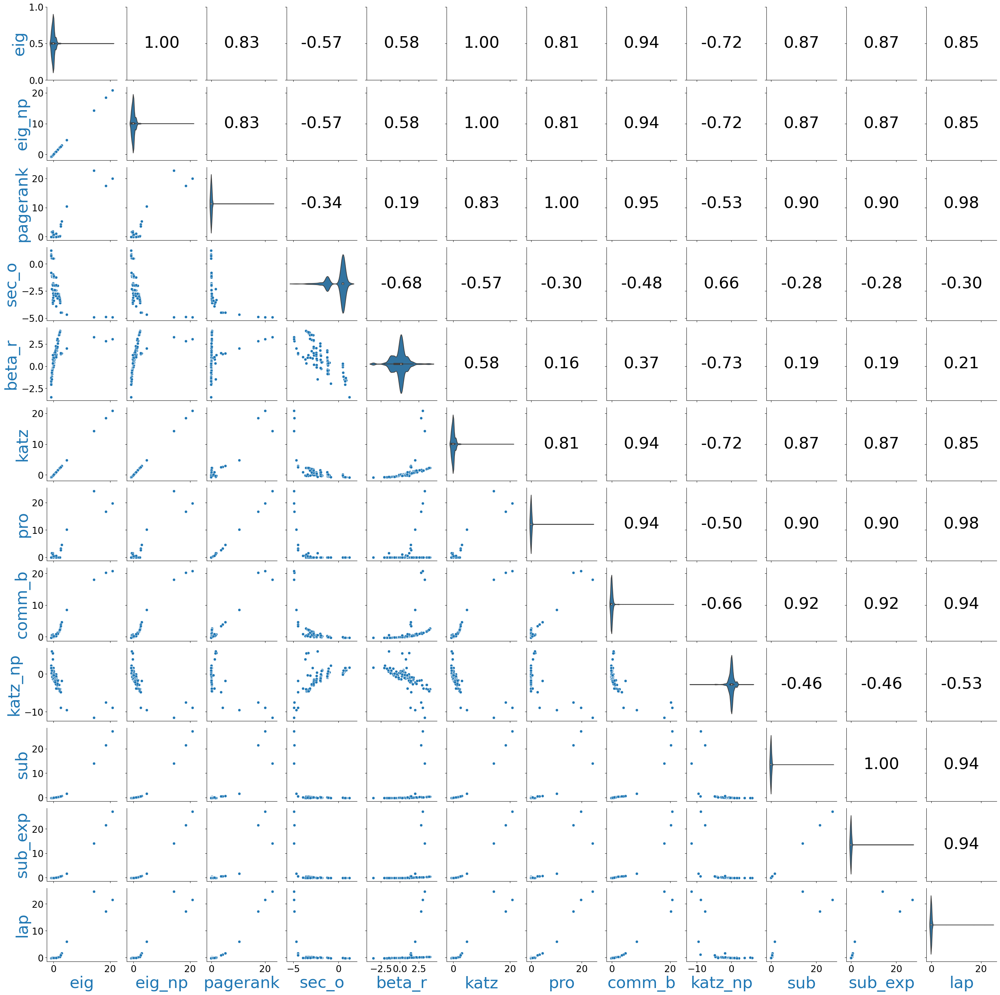

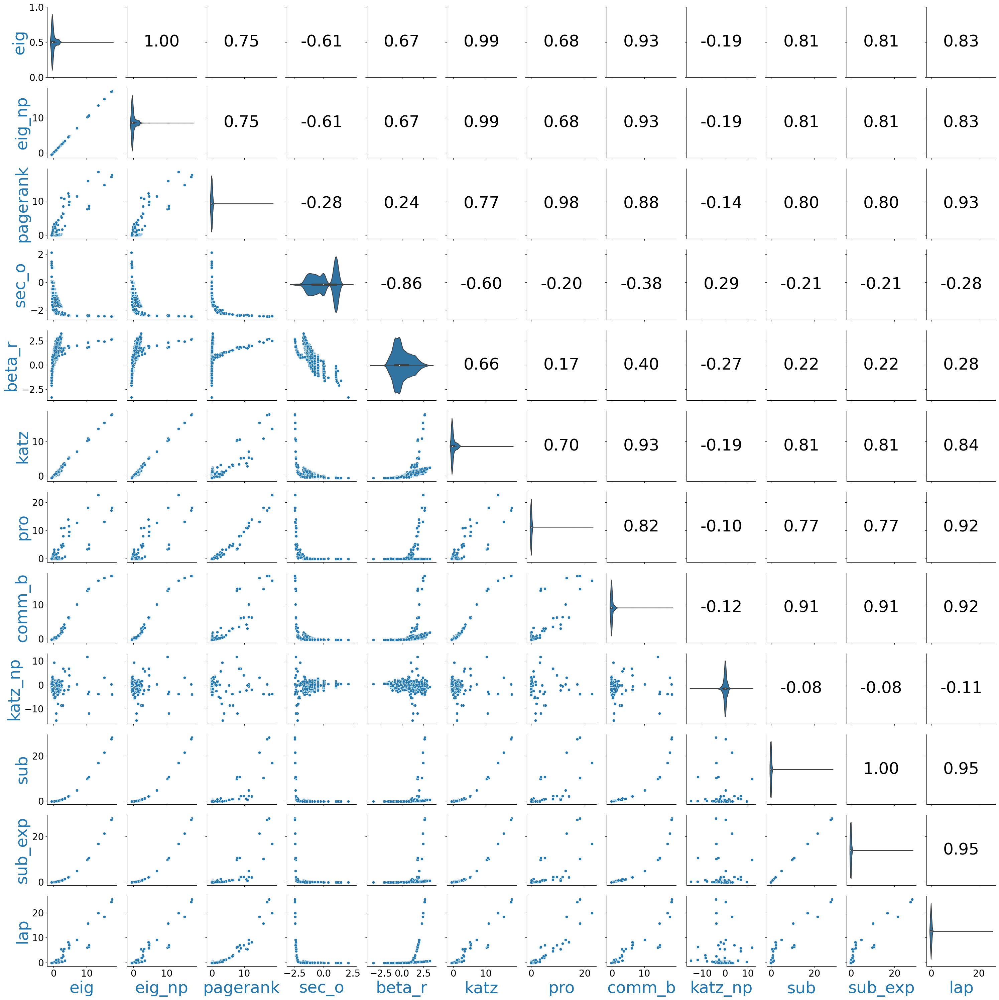

In [10]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

def corr_func(x, y, **kwargs):
    corr_coef = x.corr(y)
    ax = plt.gca()
    ax.annotate(f"{corr_coef:.2f}", xy=(0.5, 0.5), xycoords=ax.transAxes, fontsize=35, ha='center', va='center')

# Load your DataFrame
corona_scaled = pd.read_excel("outputs/corona_centrality_measures/corona_data_for_analysis/corona_centrality_scaled_data.xlsx")
influenza_scaled = pd.read_excel("outputs/influenza_centrality_measures/influenza_data_for_analysis/influenza_centrality_scaled_data.xlsx")

corona_scaled = corona_scaled.drop(['Node', 'corona_nodes'], axis=1)
influenza_scaled = influenza_scaled.drop(['Node', 'influenza_nodes'], axis=1)

# Rename the large name for better visualition 
corona_scaled.rename(columns={'closeness_centrality': 'clo'}, inplace=True)
corona_scaled.rename(columns={'harmonic_centrality': 'har'}, inplace=True)
corona_scaled.rename(columns={'degree_centrality': 'deg'}, inplace=True)
corona_scaled.rename(columns={'decay_centrality': 'dec'}, inplace=True)
corona_scaled.rename(columns={'eccentricity': 'ecc'}, inplace=True)
corona_scaled.rename(columns={'radiality_centrality': 'rad'}, inplace=True)
corona_scaled.rename(columns={'load_centrality': 'load'}, inplace=True)
corona_scaled.rename(columns={'approximate_current_flow_betweenness_centrality': 'aprx_cfb'}, inplace=True)
corona_scaled.rename(columns={'betweenness_centrality': 'bet'}, inplace=True)
corona_scaled.rename(columns={'current_flow_closeness_centrality': 'cfc'}, inplace=True)
corona_scaled.rename(columns={'information_centrality': 'info'}, inplace=True)
corona_scaled.rename(columns={'current_flow_betweenness_centrality': 'cfb'}, inplace=True)
corona_scaled.rename(columns={'eigenvector_centrality': 'eig'}, inplace=True)
corona_scaled.rename(columns={'eigenvector_centrality_numpy': 'eig_np'}, inplace=True)
corona_scaled.rename(columns={'pagerank': 'pagerank'}, inplace=True)
corona_scaled.rename(columns={'second_order_centrality': 'sec_o'}, inplace=True)
corona_scaled.rename(columns={'beta_reach_centrality': 'beta_r'}, inplace=True)
corona_scaled.rename(columns={'katz_centrality': 'katz'}, inplace=True)
corona_scaled.rename(columns={'proximal_betweenness': 'pro'}, inplace=True)
corona_scaled.rename(columns={'communicability_betweenness_centrality': 'comm_b'}, inplace=True)
corona_scaled.rename(columns={'katz_centrality_numpy': 'katz_np'}, inplace=True)
corona_scaled.rename(columns={'subgraph_centrality': 'sub'}, inplace=True)
corona_scaled.rename(columns={'subgraph_centrality_exp': 'sub_exp'}, inplace=True)
corona_scaled.rename(columns={'laplacian_centrality': 'lap'}, inplace=True)

influenza_scaled.rename(columns={'closeness_centrality': 'clo'}, inplace=True)
influenza_scaled.rename(columns={'harmonic_centrality': 'har'}, inplace=True)
influenza_scaled.rename(columns={'degree_centrality': 'deg'}, inplace=True)
influenza_scaled.rename(columns={'decay_centrality': 'dec'}, inplace=True)
influenza_scaled.rename(columns={'eccentricity': 'ecc'}, inplace=True)
influenza_scaled.rename(columns={'radiality_centrality': 'rad'}, inplace=True)
influenza_scaled.rename(columns={'load_centrality': 'load'}, inplace=True)
influenza_scaled.rename(columns={'approximate_current_flow_betweenness_centrality': 'aprx_cfb'}, inplace=True)
influenza_scaled.rename(columns={'betweenness_centrality': 'bet'}, inplace=True)
influenza_scaled.rename(columns={'current_flow_closeness_centrality': 'cfc'}, inplace=True)
influenza_scaled.rename(columns={'information_centrality': 'info'}, inplace=True)
influenza_scaled.rename(columns={'current_flow_betweenness_centrality': 'cfb'}, inplace=True)
influenza_scaled.rename(columns={'eigenvector_centrality': 'eig'}, inplace=True)
influenza_scaled.rename(columns={'eigenvector_centrality_numpy': 'eig_np'}, inplace=True)
influenza_scaled.rename(columns={'pagerank': 'pagerank'}, inplace=True)
influenza_scaled.rename(columns={'second_order_centrality': 'sec_o'}, inplace=True)
influenza_scaled.rename(columns={'beta_reach_centrality': 'beta_r'}, inplace=True)
influenza_scaled.rename(columns={'katz_centrality': 'katz'}, inplace=True)
influenza_scaled.rename(columns={'proximal_betweenness': 'pro'}, inplace=True)
influenza_scaled.rename(columns={'communicability_betweenness_centrality': 'comm_b'}, inplace=True)
influenza_scaled.rename(columns={'katz_centrality_numpy': 'katz_np'}, inplace=True)
influenza_scaled.rename(columns={'subgraph_centrality': 'sub'}, inplace=True)
influenza_scaled.rename(columns={'subgraph_centrality_exp': 'sub_exp'}, inplace=True)
influenza_scaled.rename(columns={'laplacian_centrality': 'lap'}, inplace=True)



dis_deg = ['clo',
           'har',
           'deg',
           'dec',
           'ecc',
           'rad',
           'load',
           'aprx_cfb',
           'bet',
           'cfc',
           'info',
           'cfb']
node_cen = ['eig',
            'eig_np',
            'pagerank',
            'sec_o',
            'beta_r',
            'katz',
            'pro',
            'comm_b',
            'katz_np',
            'sub',
            'sub_exp',
            'lap']


def increase_font_size(*args, **kwargs):
    kwargs['fontsize'] = 35  # Adjust the fontsize as needed
    ax = plt.gca()
    ax.tick_params(axis='both', labelsize=20)  # Increase font size for ticks
    ax.set_xlabel(ax.get_xlabel(), **kwargs)
    ax.set_ylabel(ax.get_ylabel(), **kwargs)

# Create a PairGrid with scatterplots and correlation values

# Distance and Degree based
g1 = sns.PairGrid(corona_scaled, vars=dis_deg)
g1.map_upper(corr_func)  
g1.map_diag(sns.violinplot) 
g1.map_lower(sns.scatterplot)
g1.map(increase_font_size)

g1_filename = "figures/scatterplot_violinplot_with_pearson_corr_values/corona_dis_deg.png"
g1.savefig(g1_filename, dpi=300, bbox_inches='tight')

g2 = sns.PairGrid(influenza_scaled, vars=dis_deg)
g2.map_upper(corr_func) 
g2.map_diag(sns.violinplot) 
g2.map_lower(sns.scatterplot)
g2.map(increase_font_size)

g2_filename = "figures/scatterplot_violinplot_with_pearson_corr_values/influenza_dis_deg.png"
g2.savefig(g2_filename, dpi=300, bbox_inches='tight')

# Other node based centrality
g3 = sns.PairGrid(corona_scaled, vars=node_cen)
g3.map_upper(corr_func) 
g3.map_diag(sns.violinplot)  
g3.map_lower(sns.scatterplot)
g3.map(increase_font_size)

g3_filename = "figures/scatterplot_violinplot_with_pearson_corr_values/corona_node_cen.png"
g3.savefig(g3_filename, dpi=300, bbox_inches='tight')

g4 = sns.PairGrid(influenza_scaled, vars=node_cen)
g4.map_upper(corr_func)  
g4.map_diag(sns.violinplot) 
g4.map_lower(sns.scatterplot)
g4.map(increase_font_size)

g4_filename = "figures/scatterplot_violinplot_with_pearson_corr_values/influenza_node_cen.png"
g4.savefig(g4_filename, dpi=300, bbox_inches='tight')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


# Forming PCA

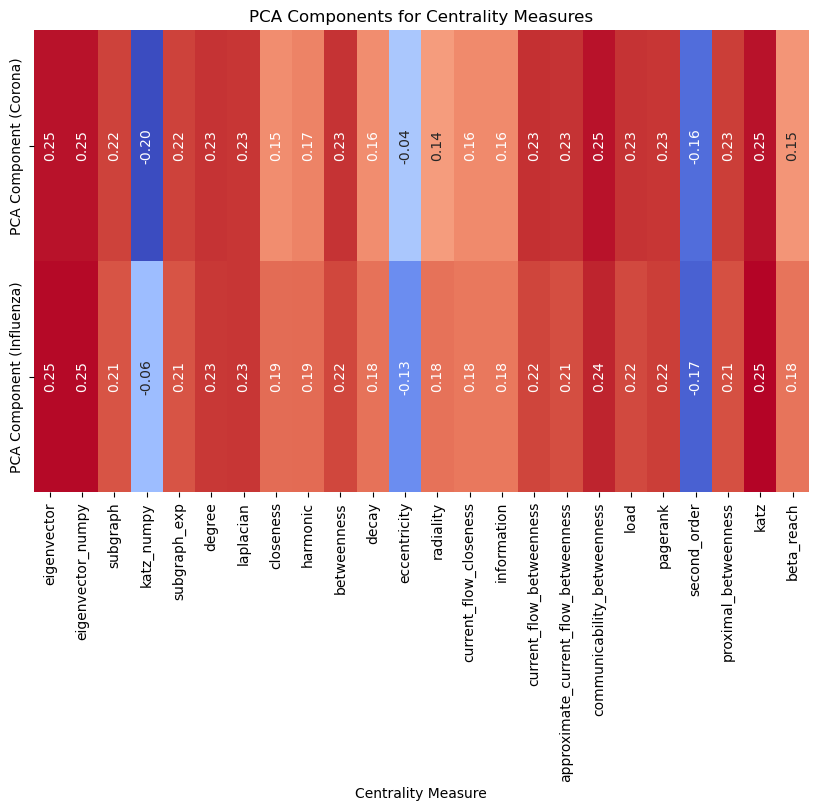

In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

# Load data from Excel files (replace with your actual file paths)
covid_scaled = pd.read_excel("outputs/corona_centrality_measures/corona_data_for_analysis/corona_centrality_scaled_data.xlsx")
influenza_scaled = pd.read_excel("outputs/influenza_centrality_measures/influenza_data_for_analysis/influenza_centrality_scaled_data.xlsx")

# Drop unnecessary columns
covid_scaled = covid_scaled.drop(['Node', 'corona_nodes'], axis=1)
influenza_scaled = influenza_scaled.drop(['Node', 'influenza_nodes'], axis=1)

# Renaming for large function name

corona_scaled.rename(columns={'approximate_current_flow_betweenness_centrality': 'aaprox_cf_betweenness'}, inplace=True)
corona_scaled.rename(columns={'Communicability_betweenness_centrality': 'comm_betweenness'}, inplace=True)

Functions = (covid_scaled.columns).tolist()

Functions = [func.replace('_centrality', '') for func in Functions]


# Perform PCA separately for each dataset
pca_covid = PCA()
pca_influenza = PCA()

pca_covid.fit(covid_scaled)
pca_influenza.fit(influenza_scaled)

# Get PCA components for each dataset
pca_components_covid = pca_covid.components_[0]
pca_components_influenza = pca_influenza.components_[0]

# Create a DataFrame for the visualization
visualization_df = pd.DataFrame({
    'Centrality Measure': Functions,
    'PCA Component (Corona)': pca_components_covid,
    'PCA Component (Influenza)': pca_components_influenza
})

# Create a heatmap-style visualization with rotated PCA values
plt.figure(figsize=(10, 6))
ax = sns.heatmap(data=visualization_df.set_index('Centrality Measure').T, cmap='coolwarm', annot=True,
                 fmt=".2f", cbar=False, annot_kws={"rotation": 90})
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)  # Reset xticklabels to horizontal
plt.title('PCA Components for Centrality Measures')

combined_filename = "figures/pca.png"
plt.savefig(combined_filename, dpi=300, bbox_inches='tight')

plt.show()

# Finding Common nodes in both datasets

In [2]:
import pandas as pd

# Read the Excel files into dataframes
covid_df = pd.read_excel("datasets/corona_nodes.xlsx")
h1n1_df = pd.read_excel("datasets/influenza_nodes.xlsx")


covid_set = set(covid_df['corona_nodes'])
h1n1_set = set(h1n1_df['influenza_nodes'])

# Find the common nodes
common_nodes = covid_set.intersection(h1n1_set)


common_nodes_list = list(common_nodes)

cn = pd.DataFrame({'common_nodes_list':common_nodes_list})
cn.to_excel('outputs/common_nodes/common_nodes_list.xlsx',index=False)

# Visualising Common nodes in both datasets

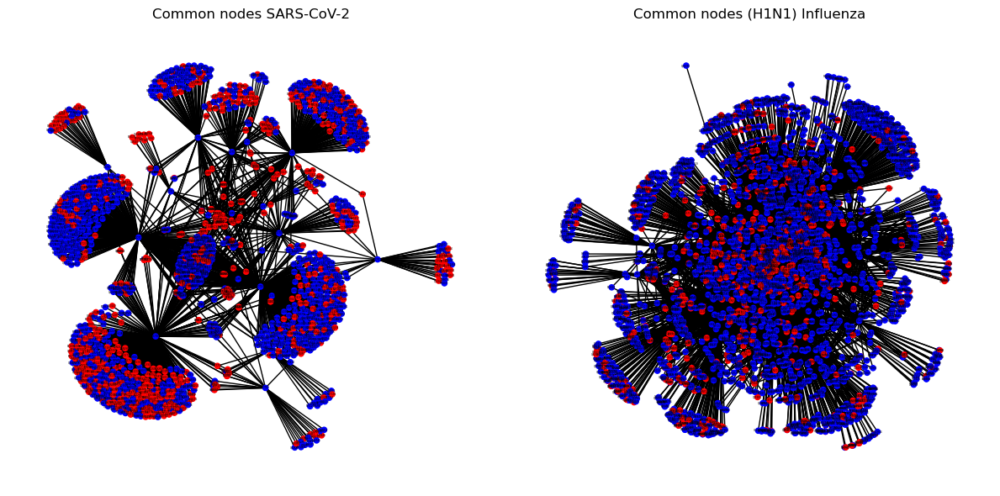

In [15]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt


data1 = pd.read_excel("datasets/corona_edges_modified.xlsx")
data2 = pd.read_excel("datasets/influenza_edges_modified.xlsx")
common_nodes = pd.read_excel("outputs/common_nodes/common_nodes_list.xlsx")


G1 = nx.Graph().to_undirected()
G2 = nx.Graph().to_undirected()

for index, row in data1.iterrows():
    node1 = row["V1"]
    node2 = row["V2"]
    G1.add_edge(node1, node2)

for index, row in data2.iterrows():
    node1 = row["V1"]
    node2 = row["V2"]
    G2.add_edge(node1, node2)

common_nodes_list = []

for index, row in common_nodes.iterrows():
    node = row["common_nodes_list"]
    common_nodes_list.append(node)


fig, axes = plt.subplots(1, 2, figsize=(12, 6))  


c_list = common_nodes_list # Fill in your list of common nodes here default is #1f78b4


node_colors_g1 = ['red' if node in c_list else 'blue' for node in G1.nodes()]
node_colors_g2 = ['red' if node in c_list else 'blue' for node in G2.nodes()]
    

pos1 = nx.spring_layout(G1)
pos2 = nx.spring_layout(G2)

nx.draw(G1, pos1, ax=axes[0], with_labels=True, node_size=20, font_size=2, node_color=node_colors_g1)
nx.draw(G2, pos2, ax=axes[1], with_labels=True, node_size=20, font_size=2, node_color=node_colors_g2)


axes[0].set_title('Common nodes SARS-CoV-2')
axes[1].set_title('Common nodes (H1N1) Influenza')

combined_graph = "figures/common_nodes_corona_influenza_dataset.png"
plt.savefig(combined_graph, dpi=300, bbox_inches='tight')


plt.tight_layout()
plt.show()

# Visualising Common nodes subgraph in both datasets

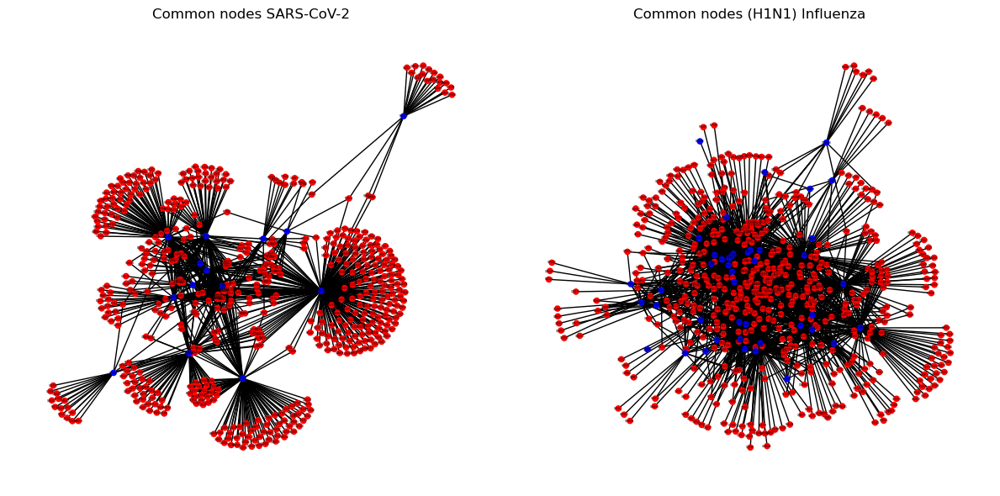

In [25]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt



data1 = pd.read_excel("datasets/corona_edges_modified.xlsx")
data2 = pd.read_excel("datasets/influenza_edges_modified.xlsx")
common_nodes = pd.read_excel("outputs/common_nodes/common_nodes_list.xlsx")

G1 = nx.Graph().to_undirected()
G2 = nx.Graph().to_undirected()

for index, row in data1.iterrows():
    node1 = row["V1"]
    node2 = row["V2"]
    G1.add_edge(node1, node2)

for index, row in data2.iterrows():
    node1 = row["V1"]
    node2 = row["V2"]
    G2.add_edge(node1, node2)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))  

common_nodes_list = []

for index, row in common_nodes.iterrows():
    node = row["common_nodes_list"]
    common_nodes_list.append(node)



c_list = common_nodes_list # Fill in your list of common nodes here default is #1f78b4


subgraph1 = nx.Graph()
subgraph2 = nx.Graph()


subgraph1.add_nodes_from(c_list)
subgraph2.add_nodes_from(c_list)


for node in c_list:
    neighbors = list(G1.neighbors(node))
    subgraph1.add_nodes_from(neighbors)
    subgraph1.add_edges_from((node, neighbor) for neighbor in neighbors)
for node in c_list:
    neighbors = list(G2.neighbors(node))
    subgraph2.add_nodes_from(neighbors)
    subgraph2.add_edges_from((node, neighbor) for neighbor in neighbors)

node_colors_subg1 = ['red' if node in c_list else 'blue' for node in subgraph1.nodes()]
node_colors_subg2 = ['red' if node in c_list else 'blue' for node in subgraph2.nodes()]
    


pos1 = nx.spring_layout(subgraph1)
pos2 = nx.spring_layout(subgraph2)

nx.draw(subgraph1, pos1, ax=axes[0], with_labels=True, node_size=20, font_size=2, node_color=node_colors_subg1)
nx.draw(subgraph2, pos2, ax=axes[1], with_labels=True, node_size=20, font_size=2, node_color=node_colors_subg2)


axes[0].set_title('Common nodes SARS-CoV-2')
axes[1].set_title('Common nodes (H1N1) Influenza')

combined_graph = "figures/subgraph_common_nodes_corona_influenza_dataset.png"
plt.savefig(combined_graph, dpi=300, bbox_inches='tight')

plt.tight_layout() 
plt.show()

s1_nodes_df = pd.DataFrame(list(subgraph1.nodes()), columns=["sub_nodes_corona"])
s1_edges_df = pd.DataFrame(list(subgraph1.edges()), columns=["V1", "V2"])
s2_nodes_df = pd.DataFrame(list(subgraph2.nodes()), columns=["sub_nodes_influenza"])
s2_edges_df = pd.DataFrame(list(subgraph2.edges()), columns=["V1", "V2"])

# Save nodes and edges dataframes to Excel files
s1_nodes_df.to_excel("outputs/common_nodes/subgraph_nodes_corona.xlsx", index=False)
s1_edges_df.to_excel("outputs/common_nodes/subgraph_edges_corona.xlsx", index=False)
s2_nodes_df.to_excel("outputs/common_nodes/subgraph_nodes_influenza.xlsx", index=False)
s2_edges_df.to_excel("outputs/common_nodes/subgraph_edges_influenza.xlsx", index=False)


# Visualising reduced graph in both datasets

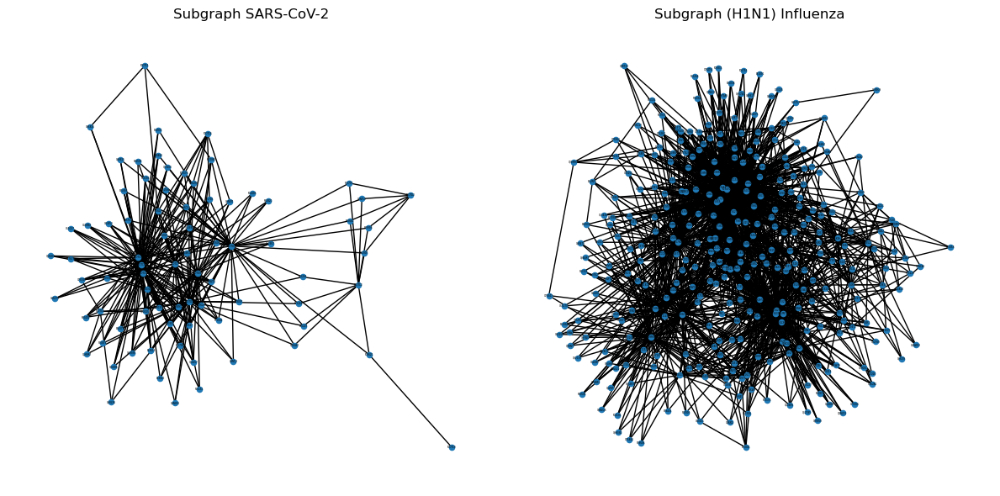

Graph with 79 nodes and 301 edges
Graph with 324 nodes and 1853 edges


In [22]:
import networkx as nx

data1 = pd.read_excel("outputs/common_nodes/subgraph_edges_corona.xlsx")
data2 = pd.read_excel("outputs/common_nodes/subgraph_edges_influenza.xlsx")


subgraph1 = nx.Graph().to_undirected()
subgraph2 = nx.Graph().to_undirected()

for index, row in data1.iterrows():
    node1 = row["V1"]
    node2 = row["V2"]
    subgraph1.add_edge(node1, node2)

for index, row in data2.iterrows():
    node1 = row["V1"]
    node2 = row["V2"]
    subgraph2.add_edge(node1, node2)


node_degrees1 = dict(subgraph1.degree())
node_degrees2 = dict(subgraph2.degree())

# For reducing subgraph nodes
degree_threshold = 2 


nodes_to_keep_sub1 = [node for node, degree in node_degrees1.items() if degree > degree_threshold]
nodes_to_keep_sub2 = [node for node, degree in node_degrees2.items() if degree > degree_threshold]



fig, axes = plt.subplots(1, 2, figsize=(12, 6))  


reduced_subgraph1 = subgraph1.subgraph(nodes_to_keep_sub1)
reduced_subgraph2 = subgraph2.subgraph(nodes_to_keep_sub2)


pos1 = nx.spring_layout(reduced_subgraph1)
pos2 = nx.spring_layout(reduced_subgraph2)

nx.draw(reduced_subgraph1, pos1, ax=axes[0], with_labels=True, node_size=20, font_size=2)
nx.draw(reduced_subgraph2, pos2, ax=axes[1], with_labels=True, node_size=20, font_size=2)


axes[0].set_title('Subgraph SARS-CoV-2')
axes[1].set_title('Subgraph (H1N1) Influenza')

combined_graph = "figures/Reduced Subgraph 79 and 324 nodes.png"
plt.savefig(combined_graph, dpi=300, bbox_inches='tight')

plt.tight_layout()  
plt.show()

s1_nodes_df = pd.DataFrame(list(reduced_subgraph1.nodes()), columns=["reduced_nodes_corona"])
s1_edges_df = pd.DataFrame(list(reduced_subgraph1.edges()), columns=["V1", "V2"])
s2_nodes_df = pd.DataFrame(list(reduced_subgraph2.nodes()), columns=["reduced_nodes_influenza"])
s2_edges_df = pd.DataFrame(list(reduced_subgraph2.edges()), columns=["V1", "V2"])


s1_nodes_df.to_excel("outputs/common_nodes/reduced_graph/reduced_nodes_corona.xlsx", index=False)
s1_edges_df.to_excel("outputs/common_nodes/reduced_graph/reduced_edges_corona.xlsx", index=False)
s2_nodes_df.to_excel("outputs/common_nodes/reduced_graph/reduced_nodes_influenza.xlsx", index=False)
s2_edges_df.to_excel("outputs/common_nodes/reduced_graph/reduced_edges_influenza.xlsx", index=False)

print(reduced_subgraph1)
print(reduced_subgraph2)

# Forming tensor product graph

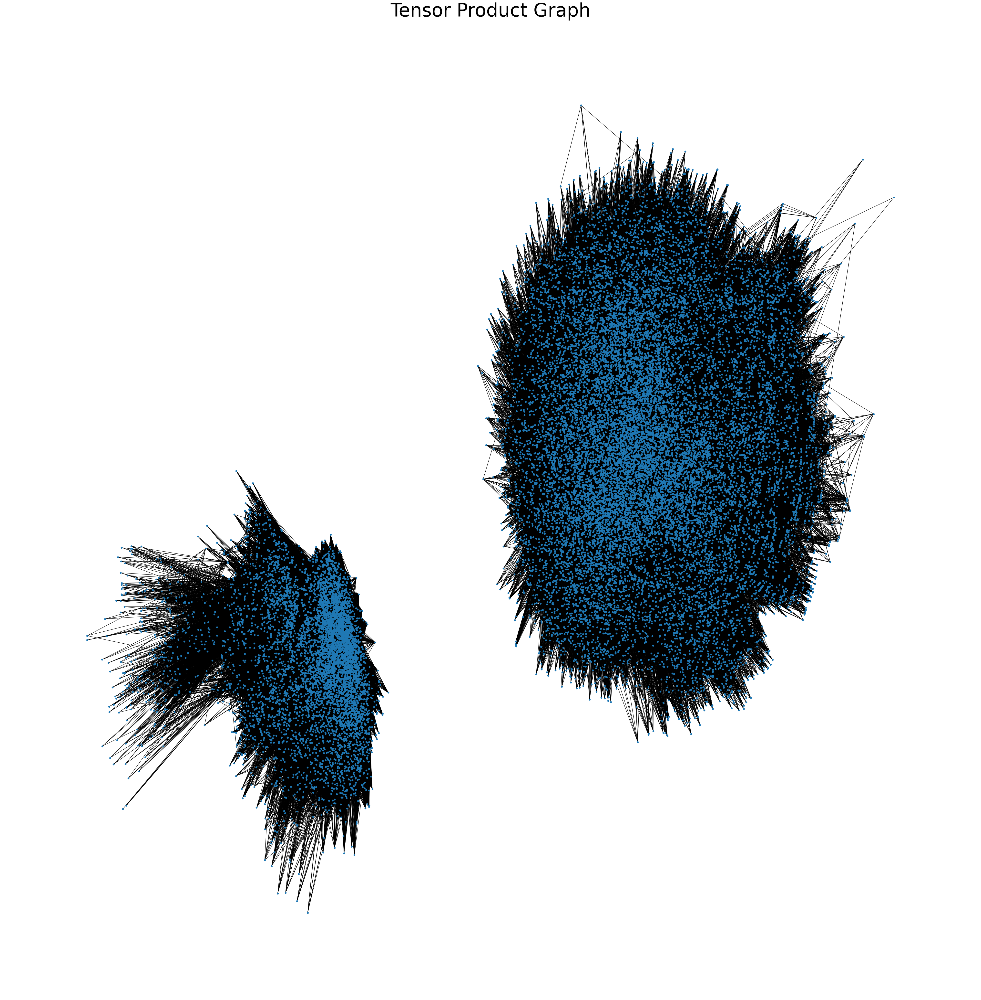

In [25]:
import networkx as nx
import matplotlib.pyplot as plt

data1 = pd.read_excel("outputs/common_nodes/reduced_graph/reduced_edges_corona.xlsx")
data2 = pd.read_excel("outputs/common_nodes/reduced_graph/reduced_edges_influenza.xlsx")


reduced_subgraph1 = nx.Graph().to_undirected()
reduced_subgraph2 = nx.Graph().to_undirected()

for index, row in data1.iterrows():
    node1 = row["V1"]
    node2 = row["V2"]
    reduced_subgraph1.add_edge(node1, node2)

for index, row in data2.iterrows():
    node1 = row["V1"]
    node2 = row["V2"]
    reduced_subgraph2.add_edge(node1, node2)



tensor_product_graph = nx.tensor_product(reduced_subgraph1, reduced_subgraph2)

pos = nx.spring_layout(tensor_product_graph)


plt.figure(figsize=(40, 40))
nx.draw(tensor_product_graph, pos,  node_size=20)
plt.title('Tensor Product Graph',fontsize=55)

combined_graph = "figures/tensor product graph with reduced graphs.png"
plt.savefig(combined_graph, dpi=300, bbox_inches='tight')

plt.show()

tpg_nodes_data = [{'Node': node} for node in tensor_product_graph.nodes()]
nodes_df = pd.DataFrame(tpg_nodes_data)
  
tpg_edges_data = [{'Source': source, 'Target': target} for source, target in tensor_product_graph.edges()]
edges_df = pd.DataFrame(tpg_edges_data)

nodes_df.to_csv('outputs/tensor_product_nodes.csv', index=False)
edges_df.to_csv('outputs/tensor_product_edges.csv', index=False)


In [26]:
print(tensor_product_graph)

Graph with 25596 nodes and 1115506 edges


# Computing root node

In [27]:
from textwrap import indent
import pandas as pd

file_path_all_nodes = "outputs/corona_centrality_measures/corona_data_for_analysis/corona_centrality_data.xlsx"


# file_path_filtered_nodes = "common_nodes/reduced_graph/subgraph_nodes_corona.xlsx"
file_path_filtered_nodes = "outputs/common_nodes/reduced_graph/reduced_nodes_corona.xlsx"

all_nodes_df = pd.read_excel(file_path_all_nodes)

filtered_nodes_df = pd.read_excel(file_path_filtered_nodes)

filtered_node_list = filtered_nodes_df['reduced_nodes_corona'].tolist()


#Corana Top 10 measures from PCA
desired_centrality_measures = [
    'eigenvector_centrality',
    'eigenvector_centrality_numpy',
    'communicability_betweenness_centrality',
    'katz_centrality',
    'degree_centrality',
    'laplacian_centrality',
    'betweenness_centrality',
    'current_flow_betweenness_centrality',
    'load_centrality',
    'pagerank',
]


# Filter the rows in the all_nodes_df based on the nodes in filtered_node_list
filtered_df = all_nodes_df[all_nodes_df['corona_nodes'].isin(filtered_node_list)]  

# Select the desired centrality measures columns
desired_columns = ['corona_nodes'] + desired_centrality_measures
filtered_df = filtered_df[desired_columns]


# Calculate the average of the 10 centrality measures and add a new "average" column
filtered_df['average'] = filtered_df[desired_centrality_measures].mean(axis=1)
print(filtered_df)

# Find the node with the highest average
node_with_highest_average = filtered_df.loc[filtered_df['average'].idxmax()]


print("Node with Highest Average:")
print(node_with_highest_average)


     corona_nodes  eigenvector_centrality  eigenvector_centrality_numpy  \
49         Q9ULX6                0.008179                      0.008179   
171        Q12907                0.048431                      0.048433   
174        P62820                0.048431                      0.048433   
307        P15151                0.038658                      0.038659   
341        Q86UT6                0.010560                      0.010561   
...           ...                     ...                           ...   
1404       P0DTC3                0.404417                      0.404405   
1405   A0A663DJA2                0.035702                      0.035701   
1406       P0DTC7                0.070952                      0.070950   
1407       P0DTD3                0.069438                      0.069436   
1408       P0DTD8                0.453322                      0.453309   

      communicability_betweenness_centrality  katz_centrality  \
49                                

In [31]:
from textwrap import indent
import pandas as pd

file_path_all_nodes = "outputs/influenza_centrality_measures/influenza_data_for_analysis/influenza_centrality_data.xlsx"

# file_path_filtered_nodes = "common_nodes/reduced_graph/subgraph_nodes_influenza.xlsx"
file_path_filtered_nodes = "outputs/common_nodes/reduced_graph/reduced_nodes_influenza.xlsx"

all_nodes_df = pd.read_excel(file_path_all_nodes)

filtered_nodes_df = pd.read_excel(file_path_filtered_nodes)

filtered_node_list = filtered_nodes_df['reduced_nodes_influenza'].tolist()


#H1N1 top 10 measures from PCA
desired_centrality_measures = [
    'eigenvector_centrality',
    'eigenvector_centrality_numpy',
    'katz_centrality',
    'communicability_betweenness_centrality',
    'degree_centrality',
    'laplacian_centrality',
    'betweenness_centrality',
    'current_flow_betweenness_centrality',
    'load_centrality',
    'pagerank',
]

# Filter the rows in the all_nodes_df based on the nodes in filtered_node_list
filtered_df = all_nodes_df[all_nodes_df['influenza_nodes'].isin(filtered_node_list)] 

# Select the desired centrality measures columns
desired_columns = ['influenza_nodes'] + desired_centrality_measures
filtered_df = filtered_df[desired_columns]


# Calculate the average of the 10 centrality measures and add a new "average" column
filtered_df['average'] = filtered_df[desired_centrality_measures].mean(axis=1)
print(filtered_df)

# Find the node with the highest average
node_with_highest_average = filtered_df.loc[filtered_df['average'].idxmax()]


print("Node with Highest Average:")
print(node_with_highest_average)


     influenza_nodes  eigenvector_centrality  eigenvector_centrality_numpy  \
0             P15311                0.019768                      0.019767   
18            Q99081                0.004288                      0.004288   
25            O75569                0.009833                      0.009832   
36            Q9UJC3                0.015103                      0.015103   
67            Q9Y287                0.008105                      0.008104   
...              ...                     ...                           ...   
2791          P03454                0.182882                      0.182891   
2792          P05777                0.292442                      0.292456   
2793          Q20MH0                0.051606                      0.051608   
2794          B4URF0                0.006172                      0.006172   
2795          Q1K9G9                0.002620                      0.002620   

      katz_centrality  communicability_betweenness_centrality  

# Visualising neighbour nodes from root nodes

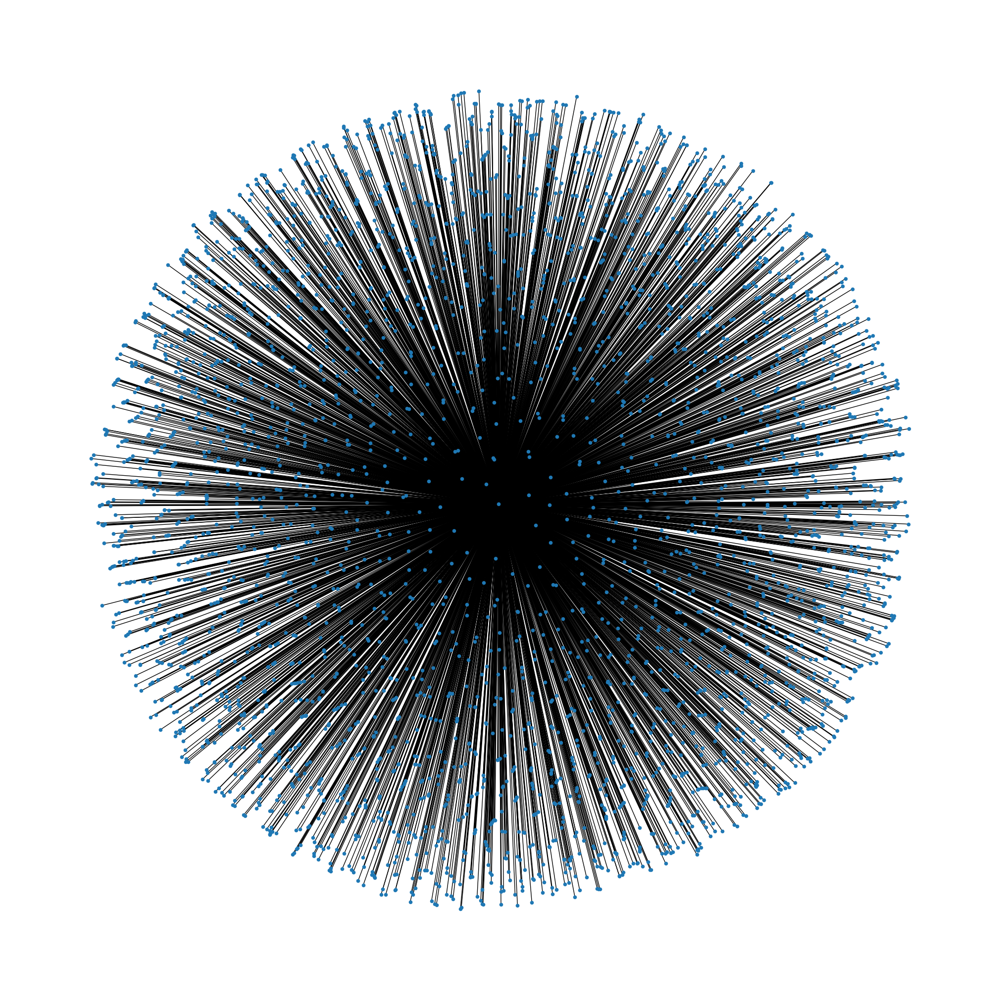

In [28]:
# root node -----> ('P0DTD8', 'P03470') 

import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt

nodes_csv = 'outputs/tensor_product_nodes.csv'
edges_csv = 'outputs/tensor_product_edges.csv'

nodes_df = pd.read_csv(nodes_csv)
edges_df = pd.read_csv(edges_csv)

tpg = nx.Graph()


for _, row in nodes_df.iterrows():
    node = row['Node']
    tpg.add_node(node)

for _, row in edges_df.iterrows():
    source = row['Source']
    target = row['Target']
    tpg.add_edge(source, target)
    

root_node = '(\'P0DTD8\', \'P03470\')'

neighbors = list(tpg.neighbors(root_node))

tpg_subgraph = tpg.subgraph([root_node] + neighbors)

pos = nx.spring_layout(tpg_subgraph)


plt.figure(figsize=(20, 20))
nx.draw(tpg_subgraph, pos,  node_size=20)

combined_graph = "figures/3744 immediate neighbors from the root_node.png"
plt.savefig(combined_graph, dpi=300, bbox_inches='tight')


plt.show()

# Groping neighbour nodes and Forming DFS Figure

Root :  ["('P0DTD8', 'P03470')"]
child :  [["('Q9NZ01', 'P49755')", "('P06576', 'P04075')", "('O43592', 'Q96SB4')", "('Q00325', 'P31948')", "('Q14257', 'P46782')", "('O95347', 'Q9NRN7')", "('P31689', 'Q9Y383')", "('Q9UBF2', 'Q13310')", "('P25705', 'P06493')", "('O43852', 'P11387')", "('P35606', 'P62140')", "('Q16891', 'Q9NZ01')", "('Q9P035', 'P06576')", "('P53621', 'O15371')", "('P55786', 'Q14315')", "('P16615', 'P26599')", "('P53618', 'O00303')", "('P05023', 'Q86UE4')", "('O14980', 'P61026')", "('Q96CS3', 'P27824')", "('P62820', 'P42677')", "('Q9NXS2', 'P35998')", "('P57088', 'P50990')", "('Q9NVI7', 'P08708')", "('P15151', 'Q13243')", "('Q12907', 'Q07021')"], ["('Q9NZ01', 'P04075')", "('P06576', 'P49755')", "('O43592', 'P31948')", "('Q00325', 'Q96SB4')", "('Q14257', 'Q9NRN7')", "('O95347', 'P46782')", "('P31689', 'Q13310')", "('Q9UBF2', 'Q9Y383')", "('P25705', 'P11387')", "('O43852', 'P06493')", "('P35606', 'Q9NZ01')", "('Q16891', 'P62140')", "('Q9P035', 'O15371')", "('P53621', 'P0657

Root :  ["('Q9NZ01', 'P49755')", "('P06576', 'P04075')", "('O43592', 'Q96SB4')", "('Q00325', 'P31948')", "('Q14257', 'P46782')", "('O95347', 'Q9NRN7')", "('P31689', 'Q9Y383')", "('Q9UBF2', 'Q13310')", "('P25705', 'P06493')", "('O43852', 'P11387')", "('P35606', 'P62140')", "('Q16891', 'Q9NZ01')", "('Q9P035', 'P06576')", "('P53621', 'O15371')", "('P55786', 'Q14315')", "('P16615', 'P26599')", "('P53618', 'O00303')", "('P05023', 'Q86UE4')", "('O14980', 'P61026')", "('Q96CS3', 'P27824')", "('P62820', 'P42677')", "('Q9NXS2', 'P35998')", "('P57088', 'P50990')", "('Q9NVI7', 'P08708')", "('P15151', 'Q13243')", "('Q12907', 'Q07021')"]
child :  [["('P0DTD1', 'P05777')", "('P0DTC5', 'Q1K9H5')", "('P0DTC3', 'P03428')", "('P0DTC7', 'P03452')", "('P0DTD3', 'P03454')", "('P0DTC8', 'P03468')", "('P0DTC6', 'P03496')", "('A0A663DJA2', 'P15682')", "('P0DTC4', 'P03431')", "('P0DTC1', 'P03430')"], ["('P0DTD1', 'Q1K9H5')", "('P0DTC5', 'P05777')", "('P0DTC3', 'P03452')", "('P0DTC7', 'P03428')", "('P0DTD3', 'P

Root :  ["('P0DTD1', 'P05777')", "('P0DTC5', 'Q1K9H5')", "('P0DTC3', 'P03428')", "('P0DTC7', 'P03452')", "('P0DTD3', 'P03454')", "('P0DTC8', 'P03468')", "('P0DTC6', 'P03496')", "('A0A663DJA2', 'P15682')", "('P0DTC4', 'P03431')", "('P0DTC1', 'P03430')"]
child :  [["('P60660', 'Q9UBX3')", "('P26599', 'O95757')", "('P35998', 'Q5H9R7')", "('O95757', 'Q13283')", "('P34932', 'P11021')", "('P62195', 'P34932')", "('Q99615', 'P62269')", "('Q13200', 'Q9BRK5')", "('Q99460', 'Q9Y265')", "('Q9NTJ3', 'P25789')", "('P11586', 'P41091')", "('P40227', 'P04406')", "('P63244', 'P50402')", "('P13797', 'P39656')", "('P59998', 'P62195')", "('P52907', 'Q9NP72')", "('Q9NYL9', 'O94973')", "('P62269', 'Q13347')", "('P04406', 'Q16875')", "('P48643', 'P48643')", "('P53007', 'Q15008')", "('Q96N67', 'Q05639')", "('P08621', 'Q9BUQ8')", "('Q9UHI6', 'Q15293')", "('Q9ULX6', 'Q99615')", "('Q5H9R7', 'Q14257')", "('P50402', 'Q15365')", "('Q15008', 'Q9UNM6')", "('O15027', 'P51148')", "('O75746', 'P62191')", "('P57678', 'O95

Root :  ["('P60660', 'Q9UBX3')", "('P26599', 'O95757')", "('P35998', 'Q5H9R7')", "('O95757', 'Q13283')", "('P34932', 'P11021')", "('P62195', 'P34932')", "('Q99615', 'P62269')", "('Q13200', 'Q9BRK5')", "('Q99460', 'Q9Y265')", "('Q9NTJ3', 'P25789')", "('P11586', 'P41091')", "('P40227', 'P04406')", "('P63244', 'P50402')", "('P13797', 'P39656')", "('P59998', 'P62195')", "('P52907', 'Q9NP72')", "('Q9NYL9', 'O94973')", "('P62269', 'Q13347')", "('P04406', 'Q16875')", "('P48643', 'P48643')", "('P53007', 'Q15008')", "('Q96N67', 'Q05639')", "('P08621', 'Q9BUQ8')", "('Q9UHI6', 'Q15293')", "('Q9ULX6', 'Q99615')", "('Q5H9R7', 'Q14257')", "('P50402', 'Q15365')", "('Q15008', 'Q9UNM6')", "('O15027', 'P51148')", "('O75746', 'P62191')", "('P57678', 'O95831')", "('O95071', 'O43852')", "('P46379', 'Q96EY1')", "('P30876', 'Q9P035')", "('Q9H936', 'Q9H078')", "('Q86UT6', 'P30153')", "('O60884', 'O95071')", "('O95816', 'O43823')", "('P40939', 'Q9Y262')"]
child :  [["('P0DTC2', 'P05780')", "('P0DTD2', 'P15659'

C:\Users\sarat\AppData\Local\Temp\ipykernel_20088\1202812542.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  corona_df = corona_df.append({'Nodes': x[0], 'Levels': f'Level {level}'}, ignore_index=True)
C:\Users\sarat\AppData\Local\Temp\ipykernel_20088\1202812542.py:135: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  influenza_df = influenza_df.append({'Nodes': x[1], 'Levels': f'Level {level}'}, ignore_index=True)
C:\Users\sarat\AppData\Local\Temp\ipykernel_20088\1202812542.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  corona_df = corona_df.append({'Nodes': x[0], 'Levels': f'Level {level}'}, ignore_index=True)
C:\Users\sarat\AppData\Local\Temp\ipykernel_20088\1202812542.py:135: FutureWarning: The frame.append me

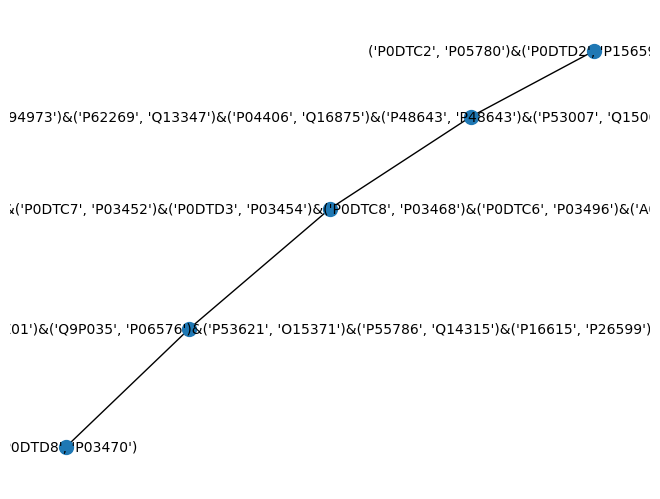

In [30]:
import ast
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt

nodes_csv = 'outputs/tensor_product_nodes.csv'
edges_csv = 'outputs/tensor_product_edges.csv'

nodes_df = pd.read_csv(nodes_csv)
edges_df = pd.read_csv(edges_csv)

tpg = nx.Graph()


for _, row in nodes_df.iterrows():
    node = row['Node']
    tpg.add_node(node)

for _, row in edges_df.iterrows():
    source = row['Source']
    target = row['Target']
    tpg.add_edge(source, target)

rootlevel_nodes = []

class Node:
    previousvertices =[]
    vertex = []
    childvertices = []

def NeighborVertexIndex( matrix ):
    return [ index for index, value in enumerate(matrix) if value == 1]

def Grouping(vertices, NeighborVerticesIndex, previousvertices):
    group = []
    for i in range(0, len(NeighborVerticesIndex)):
        group.append([])
    for i in NeighborVerticesIndex:
        if CanVertexAddedToBranch(vertices[i], previousvertices):
            for g in group:
                if len(g) == 0:                    
                    g.append( vertices[i] )                
                    break
                else:                    
                    if CanVertexAddedToGroup(vertices[i], g):
                        g.append( vertices[i] )
                        break
    return group

def CanVertexAddedToBranch(vertex, parentvertices):
    g = []
    h = []
    for i in parentvertices: 
        x = list(ast.literal_eval(i))        
        g.append(x[0])
        h.append(x[1])
    x = list(ast.literal_eval(vertex))
    if (x[0] not in g) and (x[1] not in h):
        return True
    return False

def CanVertexAddedToGroup(vertex, existingvertices):
    for i in existingvertices:
        if not(IsGroupingRuleMatch(vertex, i)):
            return False
    return True

def IsGroupingRuleMatch( vertex1, vertex2 ):
    v1 = list(ast.literal_eval(vertex1))
    v2 = list(ast.literal_eval(vertex2))
    lp, lq = v1[0], v1[1]
    lm, ln = v2[0], v2[1]
    if lp[1:] != lm[1:] and lq[1:] != ln[1:]:
        return True
    return False

def DFS(rootNode, vertices, matrix, DFS_edges):
    print("Root : ", rootNode.vertex)
    rootlevel_nodes.append(rootNode.vertex)
    neighborVertexIndex = []    
    for i in rootNode.vertex:        
        rootIndex = vertices.index(i)
        neighborVertexIndex += NeighborVertexIndex(matrix[rootIndex])
        rootNode.previousvertices.append(i)
    print("child : ", Grouping(vertices, neighborVertexIndex, rootNode.previousvertices ))
    print("")
    
    grp = Grouping(vertices, neighborVertexIndex, rootNode.previousvertices)
    i = grp[0]
    
    if len(i) > 0:
        node = Node()
        node.vertex = i[:]
        node.previousvertices = rootNode.previousvertices
        DFS_edges.append( ("&".join(rootNode.vertex), "&".join(node.vertex)) )
        rootNode.childvertices.append( node )
        DFS(node, vertices, matrix, DFS_edges)

import networkx as nx
import numpy as np

rootNode = Node()
rootNode.vertex.append('(\'P0DTD8\', \'P03470\')')

# Get the adjacency matrix as a NumPy array

vertices = list(tpg.nodes())
matrix = nx.linalg.graphmatrix.adjacency_matrix(tpg).toarray()
DFS_edges = []


DFS(rootNode, vertices, matrix, DFS_edges)

# DFS Figure

tpg_outputGraph = nx.Graph().to_undirected()
tpg_outputGraph.add_edges_from( DFS_edges )
pos = nx.spring_layout(tpg_outputGraph)  
nx.draw(tpg_outputGraph, pos, with_labels=True, node_size=100,font_size=10)

combined_graph = "figures/dfs graph from root_node.png"
plt.savefig(combined_graph, dpi=300, bbox_inches='tight')


corona_df = pd.DataFrame(columns=['Nodes', 'Levels'])
influenza_df = pd.DataFrame(columns=['Nodes', 'Levels'])

level = 0

for i in rootlevel_nodes:
    level += 1
    for j in i:
        x = list(ast.literal_eval(j))
        corona_df = corona_df.append({'Nodes': x[0], 'Levels': f'Level {level}'}, ignore_index=True)
        influenza_df = influenza_df.append({'Nodes': x[1], 'Levels': f'Level {level}'}, ignore_index=True)

tpg_edges = [{'Source': source, 'Target': target} for source, target in tpg_outputGraph.edges()]
edges_df = pd.DataFrame(tpg_edges)


edges_df.to_csv('outputs/DFS_edges.csv', index=False)
corona_df.to_excel("outputs/rootlevel_corona_nodes.xlsx", index=False)
influenza_df.to_excel("outputs/rootlevel_influenza_nodes.xlsx", index=False)

# Level wise highlighting nodes Figure

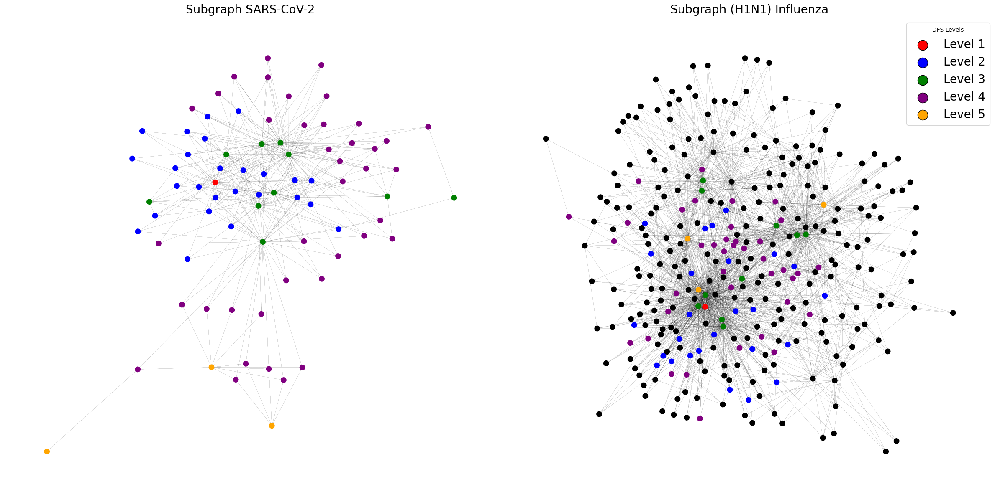

Graph with 79 nodes and 301 edges
Graph with 324 nodes and 1853 edges


In [32]:
import networkx as nx
import pandas as pd

data1 = pd.read_excel("outputs/common_nodes/reduced_graph/reduced_edges_corona.xlsx")
data2 = pd.read_excel("outputs/common_nodes/reduced_graph/reduced_edges_influenza.xlsx")


reduced_subgraph1 = nx.Graph().to_undirected()
reduced_subgraph2 = nx.Graph().to_undirected()

for index, row in data1.iterrows():
    node1 = row["V1"]
    node2 = row["V2"]
    reduced_subgraph1.add_edge(node1, node2)

for index, row in data2.iterrows():
    node1 = row["V1"]
    node2 = row["V2"]
    reduced_subgraph2.add_edge(node1, node2)





rootlevel_corona_nodes = pd.read_excel("outputs/rootlevel_corona_nodes.xlsx")

c_level1 = []
c_level2 = []
c_level3 = []
c_level4 = []
c_level5 = []

for index, level in rootlevel_corona_nodes.iterrows():
    if level['Levels'] == "Level 1":
        c_level1.append(level['Nodes'])
    elif level['Levels'] == "Level 2":
        c_level2.append(level['Nodes'])
    elif level['Levels'] == "Level 3":
        c_level3.append(level['Nodes'])
    elif level['Levels'] == "Level 4":
        c_level4.append(level['Nodes'])
    elif level['Levels'] == "Level 5":
        c_level5.append(level['Nodes'])
        
rootlevel_influenza_nodes = pd.read_excel("outputs/rootlevel_influenza_nodes.xlsx")

i_level1 = []
i_level2 = []
i_level3 = []
i_level4 = []
i_level5 = []

for index, level in rootlevel_influenza_nodes.iterrows():
    if level['Levels'] == "Level 1":
        i_level1.append(level['Nodes'])
    elif level['Levels'] == "Level 2":
        i_level2.append(level['Nodes'])
    elif level['Levels'] == "Level 3":
        i_level3.append(level['Nodes'])
    elif level['Levels'] == "Level 4":
        i_level4.append(level['Nodes'])
    elif level['Levels'] == "Level 5":
        i_level5.append(level['Nodes'])

    
    
fig, axes = plt.subplots(1, 2, figsize=(24, 12))  

reduced_colors_subg1 = []
reduced_colors_subg2 = []

for node in reduced_subgraph1.nodes():
    if node in c_level1:
        reduced_colors_subg1.append('red')
    elif node in c_level2:
        reduced_colors_subg1.append('blue')
    elif node in c_level3:
        reduced_colors_subg1.append('green')
    elif node in c_level4:
        reduced_colors_subg1.append('purple')
    elif node in c_level5:
        reduced_colors_subg1.append('orange')
    else:
        reduced_colors_subg1.append('black')
for node in reduced_subgraph2.nodes():
    if node in i_level1:
        reduced_colors_subg2.append('red')
    elif node in i_level2:
        reduced_colors_subg2.append('blue')
    elif node in i_level3:
        reduced_colors_subg2.append('green')
    elif node in i_level4:
        reduced_colors_subg2.append('purple')
    elif node in i_level5:
        reduced_colors_subg2.append('orange')
    else:
        reduced_colors_subg2.append('black')


# Assign colors to levels
level_colors = {
    1: 'red',
    2: 'blue',
    3: 'green',
    4: 'purple',
    5: 'orange'
}
        
pos1 = nx.spring_layout(reduced_subgraph1)
pos2 = nx.spring_layout(reduced_subgraph2)
for level, color in level_colors.items():
    plt.scatter([], [], color=color, label=f'Level {level}', s=300, edgecolor='black')

nx.draw(reduced_subgraph1, pos1, ax=axes[0], with_labels=False, node_size=80,  node_color = reduced_colors_subg1,edge_color='black', width=0.1)

plt.legend(scatterpoints=1, frameon=True, title='DFS Levels', bbox_to_anchor=(1.0, 1.0), prop={'size': 20})


nx.draw(reduced_subgraph2, pos2, ax=axes[1], with_labels=False, node_size=80,  node_color = reduced_colors_subg2,edge_color='black',width=0.1)

# Set titles for subplots
axes[0].set_title('Subgraph SARS-CoV-2',fontsize=20)
axes[1].set_title('Subgraph (H1N1) Influenza',fontsize=20)


combined_graph = "figures/After DFS nodes with level in reduced graph.png"
plt.savefig(combined_graph, dpi=300, bbox_inches='tight')



plt.tight_layout()  # Adjust layout for better spacing
plt.show()

# print(reduced_subgraph1)
# print(reduced_subgraph2)